In [1]:
#CycleGAN for MRI Style Transfer (T1 ↔ T2)
#==========================================
#This implementation performs unpaired image-to-image translation between
#T1 and T2 MRI images using CycleGAN architecture with modified U-Net generators.

#Project Requirements:
#- Modified U-Net architecture for generators
#- Two discriminators for adversarial training
#- Cycle consistency loss and identity loss
#- Unpaired dataset handling

In [94]:
# ============================================================================
# 1. IMPORT LIBRARIES
# ============================================================================

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
from tensorflow.keras.utils import plot_model
import pydot
import imageio
import glob
from PIL import Image

print("TensorFlow Version:", tf.__version__)

import os, shutil

# Add Anaconda bin dir (where 'dot' is) to PATH *inside this process*
os.environ["PATH"] += os.pathsep + "/Applications/anaconda3/bin"

print("PATH =", os.environ["PATH"])
print("dot  =", shutil.which("dot"))


TensorFlow Version: 2.16.2
PATH = /Applications/anaconda3/bin:/usr/local/bin:/usr/bin:/bin:/usr/sbin:/sbin:/Library/TeX/texbin:/Applications/anaconda3/bin:/Applications/anaconda3/bin:/Applications/anaconda3/bin
dot  = /Applications/anaconda3/bin/dot


In [3]:
# ============================================================================
# 2. CONFIGURATION AND HYPERPARAMETERS
# ============================================================================
# Image dimensions
IMG_HEIGHT = 256  # Standard for MRI images
IMG_WIDTH = 256
IMG_CHANNELS = 1  # Grayscale MRI images

# Training parameters
BATCH_SIZE = 1  # Use 1 for high-res images, increase if you have GPU memory
EPOCHS = 100
BUFFER_SIZE = 1000

# Loss weights
LAMBDA_CYCLE = 10.0  # Weight for cycle consistency loss
LAMBDA_IDENTITY = 0.5  # Weight for identity loss

# Optimizer parameters
LEARNING_RATE = 2e-4
BETA_1 = 0.5

# Paths
TRAIN_T1_PATH = '/Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/Tr1/TrainT1'  # Path to T1 images
TRAIN_T2_PATH = '/Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/Tr2/TrainT2'  # Path to T2 images
CHECKPOINT_PATH = '/Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints'
RESULTS_PATH = '/Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/results'

# Create directories if they don't exist
os.makedirs(CHECKPOINT_PATH, exist_ok=True)
os.makedirs(RESULTS_PATH, exist_ok=True)

In [4]:
# ============================================================================
# 3. DATA LOADING AND PREPROCESSING
# ============================================================================

def load_image(image_file):
    """
    Load and preprocess a single image file
    
    Args:
        image_file: Path to image file (tf.string when used in Dataset.map)
    
    Returns:
        Preprocessed image tensor normalized to [-1, 1]
    """
    # Read image bytes
    image = tf.io.read_file(image_file)

    # Automatically decode PNG/JPEG/etc
    image = tf.image.decode_image(
        image,
        channels=IMG_CHANNELS,
        expand_animations=False
    )

    # Set static shape for later ops (important when using decode_image)
    image.set_shape([None, None, IMG_CHANNELS])

    # Convert to float32 and normalize to [-1, 1]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1.0

    return image


def resize_image(image, height, width):
    """
    Resize image to target dimensions
    
    Args:
        image: Input image tensor
        height: Target height
        width: Target width
    
    Returns:
        Resized image tensor
    """
    image = tf.image.resize(image, [height, width],
                           method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return image

def random_crop(image, height, width):
    """
    Randomly crop image for data augmentation
    
    Args:
        image: Input image tensor
        height: Crop height
        width: Crop width
    
    Returns:
        Cropped image tensor
    """
    cropped_image = tf.image.random_crop(image, size=[height, width, IMG_CHANNELS])
    return cropped_image

def normalize_image(image):
    """
    Normalize image to [-1, 1] range
    
    Args:
        image: Input image tensor
    
    Returns:
        Normalized image tensor
    """
    image = (image / 127.5) - 1
    return image

def random_jitter(image, target_height=286, target_width=286):
    """
    Apply random jitter for data augmentation:
    - Resize to larger size
    - Random crop back to target size
    - Random horizontal flip
    
    Args:
        image: Input image tensor
        target_height: Height after resize (before crop)
        target_width: Width after resize (before crop)
    
    Returns:
        Augmented image tensor
    """
    # Resize to larger size
    image = resize_image(image, target_height, target_width)
    
    # Random crop back to original size
    image = random_crop(image, IMG_HEIGHT, IMG_WIDTH)
    
    # Random horizontal flip (50% chance)
    image = tf.image.random_flip_left_right(image)
    
    return image

def preprocess_image_train(image_path):
    """
    Complete preprocessing pipeline for training images
    
    Args:
        image_path: Path to image file
    
    Returns:
        Preprocessed and augmented image tensor
    """
    image = load_image(image_path)
    image = random_jitter(image)
    return image

def preprocess_image_test(image_path):
    """
    Preprocessing pipeline for test images (no augmentation)
    
    Args:
        image_path: Path to image file
    
    Returns:
        Preprocessed image tensor
    """
    image = load_image(image_path)
    image = resize_image(image, IMG_HEIGHT, IMG_WIDTH)
    return image

# Load file paths
print("Loading image paths...")
t1_files = sorted(glob.glob(os.path.join(TRAIN_T1_PATH, '*')))
t2_files = sorted(glob.glob(os.path.join(TRAIN_T2_PATH, '*')))

print(f"Found {len(t1_files)} T1 images")
print(f"Found {len(t2_files)} T2 images")

# Create TensorFlow datasets
t1_dataset = tf.data.Dataset.from_tensor_slices(t1_files)
t2_dataset = tf.data.Dataset.from_tensor_slices(t2_files)

# Apply preprocessing
t1_dataset = t1_dataset.map(preprocess_image_train, 
                            num_parallel_calls=tf.data.AUTOTUNE)
t2_dataset = t2_dataset.map(preprocess_image_train,
                            num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
t1_dataset = t1_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
t2_dataset = t2_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# Cache and prefetch for performance
t1_dataset = t1_dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
t2_dataset = t2_dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

print("Datasets created successfully!")


Loading image paths...
Found 43 T1 images
Found 46 T2 images
Datasets created successfully!



Displaying sample images...


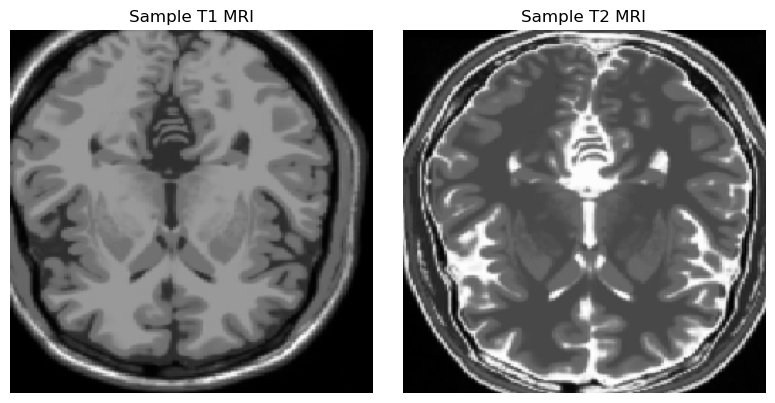

In [5]:
# ============================================================================
# 4. VISUALIZATION
# ============================================================================

def display_sample_images():
    """Display sample T1 and T2 images"""
    sample_t1 = next(iter(t1_dataset))
    sample_t2 = next(iter(t2_dataset))
    
    plt.figure(figsize=(8, 4))
    
    plt.subplot(1, 2, 1)
    plt.title('Sample T1 MRI')
    plt.imshow(sample_t1[0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.title('Sample T2 MRI')
    plt.imshow(sample_t2[0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_PATH, 'sample_images.png'))
    plt.show()
    
    return sample_t1, sample_t2

print("\nDisplaying sample images...")
sample_t1, sample_t2 = display_sample_images()


In [6]:
# ============================================================================
# 5. MODEL BUILDING - INSTANCE NORMALIZATION
# ============================================================================

class InstanceNormalization(tf.keras.layers.Layer):
    """
    Instance Normalization Layer
    
    Specially designed for style transfer tasks where separate normalization
    is performed for each sample. Computes mean and variance across spatial
    dimensions (H, W) for each channel independently.
    
    Args:
        epsilon: Small constant for numerical stability
    """
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        """
        Create trainable scale and offset parameters
        
        Args:
            input_shape: Shape of input tensor
        """
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],  # One value per channel
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True
        )
        
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True
        )
    
    def call(self, x):
        """
        Apply instance normalization
        
        Args:
            x: Input tensor of shape (batch, height, width, channels)
        
        Returns:
            Normalized tensor
        """
        # Compute mean and variance across spatial dimensions (H, W)
        # axes=[1,2] ensures instance normalization (per-sample, per-channel)
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        
        # Compute inverse of standard deviation
        inv = tf.math.rsqrt(variance + self.epsilon)
        
        # Normalize
        normalized = (x - mean) * inv
        
        # Apply learned scale and offset
        return self.scale * normalized + self.offset


In [7]:
# ============================================================================
# 6. MODEL BUILDING - DOWNSAMPLING BLOCK
# ============================================================================

def downsample(filters, size, apply_norm=True):
    """
    Downsampling block using Conv2D
    
    Architecture:
    - Conv2D with stride 2 (reduces spatial dimensions by half)
    - Instance Normalization (optional)
    - LeakyReLU activation
    
    Args:
        filters: Number of filters in convolution layer
        size: Kernel size for convolution
        apply_norm: Whether to apply instance normalization
    
    Returns:
        Sequential model containing the downsampling block
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    
    # Convolution layer (stride=2 reduces spatial dimensions)
    result.add(
        tf.keras.layers.Conv2D(
            filters, 
            size, 
            strides=2, 
            padding='same',
            kernel_initializer=initializer, 
            use_bias=False
        )
    )
    
    # Instance normalization
    if apply_norm:
        result.add(InstanceNormalization())
    
    # Activation
    result.add(tf.keras.layers.LeakyReLU())
    
    return result


In [8]:
# ============================================================================
# 7. MODEL BUILDING - UPSAMPLING BLOCK
# ============================================================================

def upsample(filters, size, apply_dropout=False):
    """
    Upsampling block using Conv2DTranspose
    
    Architecture:
    - Conv2DTranspose with stride 2 (doubles spatial dimensions)
    - Instance Normalization
    - Dropout (optional, for regularization)
    - ReLU activation
    
    Args:
        filters: Number of filters in transposed convolution layer
        size: Kernel size for transposed convolution
        apply_dropout: Whether to apply dropout (0.5 rate)
    
    Returns:
        Sequential model containing the upsampling block
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    
    # Transposed convolution layer (stride=2 doubles spatial dimensions)
    result.add(
        tf.keras.layers.Conv2DTranspose(
            filters, 
            size, 
            strides=2,
            padding='same',
            kernel_initializer=initializer, 
            use_bias=False
        )
    )
    
    # Instance normalization
    result.add(InstanceNormalization())
    
    # Dropout for regularization
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    
    # Activation
    result.add(tf.keras.layers.ReLU())
    
    return result


In [9]:
# ============================================================================
# 8. MODEL BUILDING - U-NET GENERATOR
# ============================================================================

def unet_generator():
    """
    U-Net Generator Architecture
    
    U-Net is an encoder-decoder architecture with skip connections.
    It's ideal for image-to-image translation tasks.
    
    Architecture:
    - Encoder (downsampling): Extracts features and compresses spatial dimensions
    - Decoder (upsampling): Reconstructs image with learned transformations
    - Skip connections: Concatenate encoder features to decoder layers
      (helps preserve spatial information and improves gradient flow)
    
    For 256x256 input:
    Encoder path:
        256x256x1 -> 128x128x64 -> 64x64x128 -> 32x32x256 -> 
        16x16x512 -> 8x8x512 -> 4x4x512 -> 2x2x512 -> 1x1x512
    
    Decoder path (with skip connections):
        1x1x512 -> 2x2x512 -> 4x4x512 -> 8x8x512 -> 
        16x16x512 -> 32x32x256 -> 64x64x128 -> 128x128x64 -> 256x256x1
    
    Returns:
        Keras Model (Generator)
    """
    # Encoder (downsampling stack)
    down_stack = [
        downsample(64, 4, apply_norm=False),  # (bs, 128, 128, 64)
        downsample(128, 4),                   # (bs, 64, 64, 128)
        downsample(256, 4),                   # (bs, 32, 32, 256)
        downsample(512, 4),                   # (bs, 16, 16, 512)
        downsample(512, 4),                   # (bs, 8, 8, 512)
        downsample(512, 4),                   # (bs, 4, 4, 512)
        downsample(512, 4),                   # (bs, 2, 2, 512)
        downsample(512, 4),                   # (bs, 1, 1, 512)
    ]
    
    # Decoder (upsampling stack)
    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024) after concat
        upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
        upsample(512, 4),                      # (bs, 16, 16, 1024)
        upsample(256, 4),                      # (bs, 32, 32, 512)
        upsample(128, 4),                      # (bs, 64, 64, 256)
        upsample(64, 4),                       # (bs, 128, 128, 128)
    ]
    
    initializer = tf.random_normal_initializer(0., 0.02)
    
    # Output layer: Conv2DTranspose to get back to original spatial dimensions
    last = tf.keras.layers.Conv2DTranspose(
        IMG_CHANNELS, 4, 
        strides=2,
        padding='same',
        kernel_initializer=initializer,
        activation='tanh'  # tanh outputs [-1, 1] range
    )  # (bs, 256, 256, 1)
    
    # Concatenation layer for skip connections
    concat = tf.keras.layers.Concatenate()
    
    # Define input
    inputs = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS])
    x = inputs
    
    # Downsampling through the model and store skip connections
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    # Reverse skip connections (exclude the last one, which is the bottleneck)
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])  # Concatenate with corresponding encoder layer
    
    # Final output layer
    x = last(x)
    
    return tf.keras.Model(inputs=inputs, outputs=x)


In [10]:
# ============================================================================
# 9. MODEL BUILDING - DISCRIMINATOR
# ============================================================================

def discriminator():
    """
    PatchGAN Discriminator
    
    Unlike traditional discriminators that output a single value,
    PatchGAN outputs a matrix of values. Each value represents whether
    a corresponding patch in the input image is real or fake.
    
    Benefits:
    - Focuses on local image structure and texture
    - Has fewer parameters than full-image discriminator
    - Produces sharper results
    
    Architecture:
    - Only uses Conv2D layers (no transposed convolutions)
    - Progressively reduces spatial dimensions
    - Uses Instance Normalization and LeakyReLU
    - Final output is a 30x30 matrix (each value classifies a 70x70 patch)
    
    For 256x256 input:
        256x256x1 -> 128x128x64 -> 64x64x128 -> 66x66x256 ->
        63x63x512 -> 62x62x1
    
    Returns:
        Keras Model (Discriminator)
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    
    # Input layer
    inp = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS], 
                                name='input_image')
    x = inp
    
    # Downsample 1: No normalization on first layer
    down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
    
    # Downsample 2
    down2 = downsample(128, 4)(down1)    # (bs, 64, 64, 128)
    
    # Downsample 3
    down3 = downsample(256, 4)(down2)    # (bs, 32, 32, 256)
    
    # Zero padding
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    
    # Conv layer without stride reduction
    conv = tf.keras.layers.Conv2D(
        512, 4, 
        strides=1,
        kernel_initializer=initializer,
        use_bias=False
    )(zero_pad1)  # (bs, 31, 31, 512)
    
    # Normalization
    norm1 = InstanceNormalization()(conv)
    
    # Activation
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    
    # Zero padding
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)
    
    # Final conv layer - outputs patch predictions
    last = tf.keras.layers.Conv2D(
        1, 4, 
        strides=1,
        kernel_initializer=initializer
    )(zero_pad2)  # (bs, 30, 30, 1)
    
    return tf.keras.Model(inputs=inp, outputs=last)



Building models...
Generator G (T1 -> T2):


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      1,024 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,328 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    524,800 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,098,176 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,195,328 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,195,328 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,195,328 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,195,328 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,195,328 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 128,  │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 128)              │            │ sequential_6[0][… │
│                     │                   │            │ sequential_9[0][… │
│                     │                   │            │ sequential_5[0][… │
│                     │                   │            │ sequential_10[0]… │
│                     │                   │            │ sequential_4[0][… │
│                     │                   │            │ sequential_11[0]… │
│                     │                   │            │ sequential_3[0][… │
│                     │                   │            │ sequential_12[0]… │
│                     │                   │            │ sequential_2[0][… │
│                     │                   │            │ sequential_13[0]… │
│                     │                   │            │ sequential_1[0][… │
│                     │                   │            │ sequential_14[0]… │
│                     │                   │            │ sequential[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,389,632 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,389,632 │ concatenate[1][0

 Total params: 54,408,833 (207.55 MB)

 Trainable params: 54,408,833 (207.55 MB)

 Non-trainable params: 0 (0.00 B)



Discriminator X (T1):


Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_30 (Sequential)      │ (None, 128, 128, 64)   │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_31 (Sequential)      │ (None, 64, 64, 128)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_32 (Sequential)      │ (None, 32, 32, 256)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 34, 34, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ instance_normalization_30       │ (None, 31, 31, 512)    │         1,024 │
│ (InstanceNormalization)         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_1                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,763,521 (10.54 MB)

 Trainable params: 2,763,521 (10.54 MB)

 Non-trainable params: 0 (0.00 B)

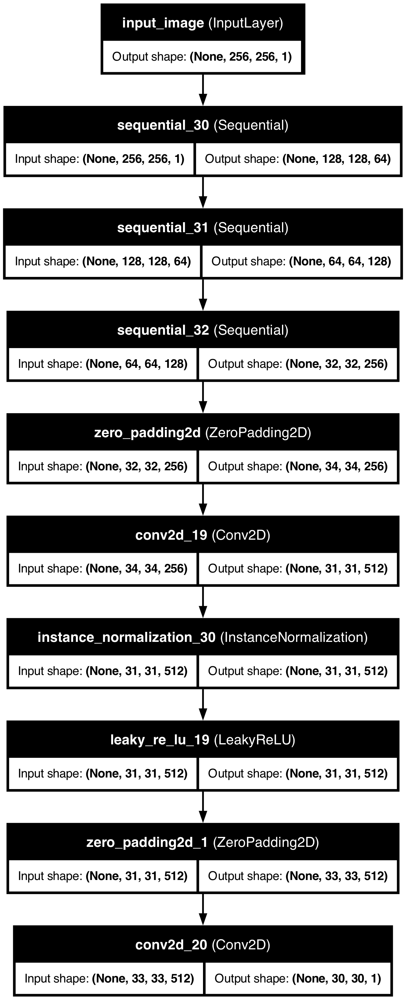

In [11]:
# ============================================================================
# 10. INSTANTIATE MODELS
# ============================================================================


print("\nBuilding models...")

# Create generators
generator_g = unet_generator()  # T1 -> T2
generator_f = unet_generator()  # T2 -> T1

# Create discriminators
discriminator_x = discriminator()  # Discriminates T1 images
discriminator_y = discriminator()  # Discriminates T2 images

print("Generator G (T1 -> T2):")
generator_g.summary()
print("\n" + "="*80 + "\n")

print("Discriminator X (T1):")
discriminator_x.summary()
print("\n" + "="*80 + "\n")

# Visualize model architecture
plot_model(generator_g, to_file=os.path.join(RESULTS_PATH, 'generator_architecture.png'), 
           show_shapes=True, show_layer_names=True)
plot_model(discriminator_x, to_file=os.path.join(RESULTS_PATH, 'discriminator_architecture.png'),
           show_shapes=True, show_layer_names=True)


In [50]:
# 11: Define loss functions
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5

def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA_CYCLE * loss

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA_IDENTITY * loss

# 12: Optimizers
generator_g_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=BETA_1)
generator_f_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=BETA_1)
discriminator_x_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=BETA_1)
discriminator_y_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=BETA_1)

# 13: Checkpointing
checkpoint = tf.train.Checkpoint(
    generator_g=generator_g,
    generator_f=generator_f,
    discriminator_x=discriminator_x,
    discriminator_y=discriminator_y,
    generator_g_optimizer=generator_g_optimizer,
    generator_f_optimizer=generator_f_optimizer,
    discriminator_x_optimizer=discriminator_x_optimizer,
    discriminator_y_optimizer=discriminator_y_optimizer
)

checkpoint_manager = tf.train.CheckpointManager(
    checkpoint, CHECKPOINT_PATH, max_to_keep=5
)

if checkpoint_manager.latest_checkpoint:
    checkpoint.restore(checkpoint_manager.latest_checkpoint)
    print(f'Latest checkpoint restored from {checkpoint_manager.latest_checkpoint}')
else:
    print('No checkpoint found. Starting fresh training.')

# 14: Complete train_step function
@tf.function
def train_step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:
        # Forward pass
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # Calculate losses (HERE is where those variables exist!)
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + \
                          calc_cycle_loss(real_y, cycled_y)
        
        total_gen_g_loss = gen_g_loss + total_cycle_loss + \
                          identity_loss(real_y, same_y)
        
        total_gen_f_loss = gen_f_loss + total_cycle_loss + \
                          identity_loss(real_x, same_x)
        
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
    
    # Calculate gradients
    generator_g_gradients = tape.gradient(
        total_gen_g_loss, 
        generator_g.trainable_variables
    )
    generator_f_gradients = tape.gradient(
        total_gen_f_loss,
        generator_f.trainable_variables
    )
    
    discriminator_x_gradients = tape.gradient(
        disc_x_loss,
        discriminator_x.trainable_variables
    )
    discriminator_y_gradients = tape.gradient(
        disc_y_loss,
        discriminator_y.trainable_variables
    )
    
    # Apply gradients
    generator_g_optimizer.apply_gradients(
        zip(generator_g_gradients, generator_g.trainable_variables)
    )
    generator_f_optimizer.apply_gradients(
        zip(generator_f_gradients, generator_f.trainable_variables)
    )
    
    discriminator_x_optimizer.apply_gradients(
        zip(discriminator_x_gradients, discriminator_x.trainable_variables)
    )
    discriminator_y_optimizer.apply_gradients(
        zip(discriminator_y_gradients, discriminator_y.trainable_variables)
    )
    
    return {
        'gen_g_loss': total_gen_g_loss,
        'gen_f_loss': total_gen_f_loss,
        'disc_x_loss': disc_x_loss,
        'disc_y_loss': disc_y_loss
    }

print("Training step function defined successfully!")


No checkpoint found. Starting fresh training.
Training step function defined successfully!


In [52]:
# ============================================================================
# 15. IMAGE GENERATION FOR VISUALIZATION
# ============================================================================

def generate_images(model1, test_input1, model2, test_input2, epoch):
    """
    Generate and save images during training for visualization
    
    Args:
        model1: Generator G (T1 -> T2)
        test_input1: Sample T1 image
        model2: Generator F (T2 -> T1)
        test_input2: Sample T2 image
        epoch: Current epoch number
    """
    prediction1 = model1(test_input1, training=False)
    prediction2 = model2(test_input2, training=False)
    
    plt.figure(figsize=(12, 4))
    
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['T1 Input', 'T1→T2 Translation', 'T2 Input', 'T2→T1 Translation']
    
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        # Rescale from [-1, 1] to [0, 1] for display
        plt.imshow(display_list[i].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_PATH, f'image_at_epoch_{epoch:04d}.png'))
    plt.close()

In [54]:
# ============================================================================
# 16. TRAINING LOOP
# ============================================================================

def train(epochs):
    """
    Main training loop
    
    For each epoch:
    1. Iterate through paired batches of T1 and T2 images
    2. Perform training step
    3. Generate sample images for visualization
    4. Save checkpoint
    5. Print progress
    
    Args:
        epochs: Number of epochs to train
    """
    print("\n" + "="*80)
    print("STARTING TRAINING")
    print("="*80)
    
    for epoch in range(1, epochs + 1):
        print(f"\nEpoch {epoch}/{epochs}")
        
        # Training metrics
        epoch_gen_g_loss = []
        epoch_gen_f_loss = []
        epoch_disc_x_loss = []
        epoch_disc_y_loss = []
        
        # Zip datasets together for paired training
        for batch_num, (image_x, image_y) in enumerate(
            tf.data.Dataset.zip((t1_dataset, t2_dataset))
        ):
            # Train on one batch
            losses = train_step(image_x, image_y)
            
            # Collect losses
            epoch_gen_g_loss.append(losses['gen_g_loss'].numpy())
            epoch_gen_f_loss.append(losses['gen_f_loss'].numpy())
            epoch_disc_x_loss.append(losses['disc_x_loss'].numpy())
            epoch_disc_y_loss.append(losses['disc_y_loss'].numpy())
            
            # Print progress every 10 batches
            if (batch_num + 1) % 10 == 0:
                print(f"  Batch {batch_num + 1} - "
                      f"Gen_G: {losses['gen_g_loss']:.4f}, "
                      f"Gen_F: {losses['gen_f_loss']:.4f}, "
                      f"Disc_X: {losses['disc_x_loss']:.4f}, "
                      f"Disc_Y: {losses['disc_y_loss']:.4f}")
        
        # Print epoch summary
        print(f"\nEpoch {epoch} Summary:")
        print(f"  Avg Gen_G Loss: {np.mean(epoch_gen_g_loss):.4f}")
        print(f"  Avg Gen_F Loss: {np.mean(epoch_gen_f_loss):.4f}")
        print(f"  Avg Disc_X Loss: {np.mean(epoch_disc_x_loss):.4f}")
        print(f"  Avg Disc_Y Loss: {np.mean(epoch_disc_y_loss):.4f}")
        
        # Generate and save sample images
        generate_images(generator_g, sample_t1, generator_f, sample_t2, epoch)
        
        # Save checkpoint every 5 epochs
        if epoch % 5 == 0:
            ckpt_save_path = checkpoint_manager.save()
            print(f"  Checkpoint saved at {ckpt_save_path}")
    
    print("\n" + "="*80)
    print("TRAINING COMPLETE!")
    print("="*80)


Checking untrained generator output...


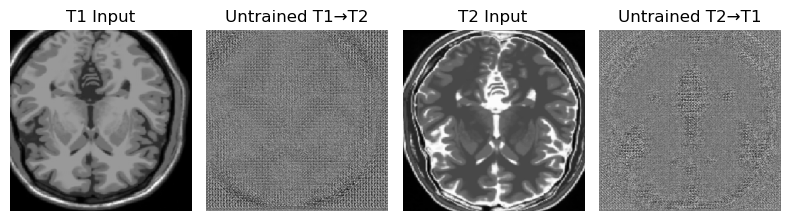


STARTING TRAINING

Epoch 1/100
  Batch 10 - Gen_G: 6.3569, Gen_F: 6.4048, Disc_X: 0.5775, Disc_Y: 0.5871
  Batch 20 - Gen_G: 4.4807, Gen_F: 4.1571, Disc_X: 0.8334, Disc_Y: 0.8268
  Batch 30 - Gen_G: 4.7150, Gen_F: 4.4353, Disc_X: 0.6536, Disc_Y: 0.6203
  Batch 40 - Gen_G: 4.5802, Gen_F: 4.1732, Disc_X: 0.6202, Disc_Y: 0.6061


2025-11-23 18:16:27.685124: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 1 Summary:
  Avg Gen_G Loss: 5.0549
  Avg Gen_F Loss: 4.9786
  Avg Disc_X Loss: 0.6968
  Avg Disc_Y Loss: 0.6989

Epoch 2/100
  Batch 10 - Gen_G: 3.3242, Gen_F: 3.6897, Disc_X: 0.5791, Disc_Y: 0.5242
  Batch 20 - Gen_G: 3.0024, Gen_F: 3.1764, Disc_X: 0.5345, Disc_Y: 0.4992
  Batch 30 - Gen_G: 3.9536, Gen_F: 3.7330, Disc_X: 0.4601, Disc_Y: 0.5978
  Batch 40 - Gen_G: 3.8783, Gen_F: 3.7809, Disc_X: 0.5282, Disc_Y: 0.5145


2025-11-23 18:19:26.641014: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 2 Summary:
  Avg Gen_G Loss: 3.3235
  Avg Gen_F Loss: 3.2997
  Avg Disc_X Loss: 0.5829
  Avg Disc_Y Loss: 0.5842

Epoch 3/100
  Batch 10 - Gen_G: 3.0004, Gen_F: 3.3377, Disc_X: 0.4843, Disc_Y: 0.4921
  Batch 20 - Gen_G: 2.9341, Gen_F: 3.0294, Disc_X: 0.5348, Disc_Y: 0.5481
  Batch 30 - Gen_G: 3.9286, Gen_F: 4.1332, Disc_X: 0.5378, Disc_Y: 0.6018
  Batch 40 - Gen_G: 3.4234, Gen_F: 3.7197, Disc_X: 0.5578, Disc_Y: 0.5543


2025-11-23 18:22:18.360037: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 3 Summary:
  Avg Gen_G Loss: 3.3344
  Avg Gen_F Loss: 3.3846
  Avg Disc_X Loss: 0.5726
  Avg Disc_Y Loss: 0.6019

Epoch 4/100
  Batch 10 - Gen_G: 3.1493, Gen_F: 3.3943, Disc_X: 0.7027, Disc_Y: 0.4950
  Batch 20 - Gen_G: 3.1082, Gen_F: 3.4077, Disc_X: 0.5753, Disc_Y: 0.6554
  Batch 30 - Gen_G: 3.5822, Gen_F: 3.7440, Disc_X: 0.6108, Disc_Y: 0.5482
  Batch 40 - Gen_G: 3.5363, Gen_F: 3.8023, Disc_X: 0.5720, Disc_Y: 0.5729


2025-11-23 18:25:03.302838: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 4 Summary:
  Avg Gen_G Loss: 3.1872
  Avg Gen_F Loss: 3.1929
  Avg Disc_X Loss: 0.5950
  Avg Disc_Y Loss: 0.5895

Epoch 5/100
  Batch 10 - Gen_G: 3.0852, Gen_F: 3.2961, Disc_X: 0.5493, Disc_Y: 0.5156
  Batch 20 - Gen_G: 2.8241, Gen_F: 3.0425, Disc_X: 0.6097, Disc_Y: 0.5646
  Batch 30 - Gen_G: 3.5201, Gen_F: 3.5051, Disc_X: 0.5928, Disc_Y: 0.5199
  Batch 40 - Gen_G: 3.4508, Gen_F: 3.3694, Disc_X: 0.6089, Disc_Y: 0.5901


2025-11-23 18:27:29.046213: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 5 Summary:
  Avg Gen_G Loss: 3.1067
  Avg Gen_F Loss: 3.1006
  Avg Disc_X Loss: 0.6063
  Avg Disc_Y Loss: 0.6064
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-1

Epoch 6/100
  Batch 10 - Gen_G: 3.2261, Gen_F: 3.8524, Disc_X: 0.5673, Disc_Y: 0.5709
  Batch 20 - Gen_G: 3.0505, Gen_F: 3.2484, Disc_X: 0.6153, Disc_Y: 0.5544
  Batch 30 - Gen_G: 3.1718, Gen_F: 3.4366, Disc_X: 0.5494, Disc_Y: 0.5496
  Batch 40 - Gen_G: 3.0101, Gen_F: 2.9711, Disc_X: 0.5902, Disc_Y: 0.6074


2025-11-23 18:49:27.900592: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 6 Summary:
  Avg Gen_G Loss: 2.9192
  Avg Gen_F Loss: 2.9466
  Avg Disc_X Loss: 0.5751
  Avg Disc_Y Loss: 0.6164

Epoch 7/100
  Batch 10 - Gen_G: 2.7934, Gen_F: 3.3587, Disc_X: 0.5383, Disc_Y: 0.5294
  Batch 20 - Gen_G: 2.7394, Gen_F: 3.2097, Disc_X: 0.6558, Disc_Y: 0.5227
  Batch 30 - Gen_G: 2.8845, Gen_F: 3.1509, Disc_X: 0.5892, Disc_Y: 0.5620
  Batch 40 - Gen_G: 2.8492, Gen_F: 2.8816, Disc_X: 0.6215, Disc_Y: 0.5586


2025-11-23 18:52:05.121095: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 7 Summary:
  Avg Gen_G Loss: 2.8730
  Avg Gen_F Loss: 2.8873
  Avg Disc_X Loss: 0.6048
  Avg Disc_Y Loss: 0.5912

Epoch 8/100
  Batch 10 - Gen_G: 2.5113, Gen_F: 3.1343, Disc_X: 0.5450, Disc_Y: 0.6207
  Batch 20 - Gen_G: 2.5324, Gen_F: 3.1507, Disc_X: 0.6341, Disc_Y: 0.5368
  Batch 30 - Gen_G: 2.7117, Gen_F: 3.2168, Disc_X: 0.5960, Disc_Y: 0.5706
  Batch 40 - Gen_G: 3.0141, Gen_F: 2.8614, Disc_X: 0.6100, Disc_Y: 0.5968


2025-11-23 18:54:31.111677: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 8 Summary:
  Avg Gen_G Loss: 2.8252
  Avg Gen_F Loss: 2.8184
  Avg Disc_X Loss: 0.5978
  Avg Disc_Y Loss: 0.6169

Epoch 9/100
  Batch 10 - Gen_G: 2.5381, Gen_F: 3.3697, Disc_X: 0.5245, Disc_Y: 0.6173
  Batch 20 - Gen_G: 2.6361, Gen_F: 3.2510, Disc_X: 0.6685, Disc_Y: 0.5747
  Batch 30 - Gen_G: 2.4616, Gen_F: 3.3059, Disc_X: 0.7207, Disc_Y: 0.5597
  Batch 40 - Gen_G: 2.6728, Gen_F: 2.8612, Disc_X: 0.6131, Disc_Y: 0.6029


2025-11-23 18:56:53.499565: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 9 Summary:
  Avg Gen_G Loss: 2.7143
  Avg Gen_F Loss: 2.7532
  Avg Disc_X Loss: 0.6080
  Avg Disc_Y Loss: 0.5976

Epoch 10/100
  Batch 10 - Gen_G: 2.6771, Gen_F: 3.2754, Disc_X: 0.5043, Disc_Y: 0.5349
  Batch 20 - Gen_G: 2.5953, Gen_F: 2.7994, Disc_X: 0.5748, Disc_Y: 0.5916
  Batch 30 - Gen_G: 2.4842, Gen_F: 3.1483, Disc_X: 0.6079, Disc_Y: 0.6380
  Batch 40 - Gen_G: 2.6064, Gen_F: 2.5215, Disc_X: 0.6513, Disc_Y: 0.5984


2025-11-23 18:59:14.766183: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 10 Summary:
  Avg Gen_G Loss: 2.6905
  Avg Gen_F Loss: 2.6997
  Avg Disc_X Loss: 0.5888
  Avg Disc_Y Loss: 0.5843
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-2

Epoch 11/100
  Batch 10 - Gen_G: 2.4237, Gen_F: 3.0034, Disc_X: 0.5690, Disc_Y: 0.5914
  Batch 20 - Gen_G: 2.7277, Gen_F: 3.0831, Disc_X: 0.5700, Disc_Y: 0.5746
  Batch 30 - Gen_G: 2.6017, Gen_F: 3.4336, Disc_X: 0.6445, Disc_Y: 0.5701
  Batch 40 - Gen_G: 2.5139, Gen_F: 2.4020, Disc_X: 0.6767, Disc_Y: 0.7022


2025-11-23 19:01:37.926493: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 11 Summary:
  Avg Gen_G Loss: 2.6896
  Avg Gen_F Loss: 2.6927
  Avg Disc_X Loss: 0.6010
  Avg Disc_Y Loss: 0.6056

Epoch 12/100
  Batch 10 - Gen_G: 2.5206, Gen_F: 2.8574, Disc_X: 0.5683, Disc_Y: 0.5533
  Batch 20 - Gen_G: 2.5256, Gen_F: 2.7758, Disc_X: 0.5688, Disc_Y: 0.5476
  Batch 30 - Gen_G: 2.4848, Gen_F: 3.1119, Disc_X: 0.5787, Disc_Y: 0.5484
  Batch 40 - Gen_G: 2.4717, Gen_F: 2.4837, Disc_X: 0.6466, Disc_Y: 0.6677


2025-11-23 19:03:57.862020: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 12 Summary:
  Avg Gen_G Loss: 2.6375
  Avg Gen_F Loss: 2.6121
  Avg Disc_X Loss: 0.6055
  Avg Disc_Y Loss: 0.5859

Epoch 13/100
  Batch 10 - Gen_G: 2.3017, Gen_F: 2.7914, Disc_X: 0.4970, Disc_Y: 0.5882
  Batch 20 - Gen_G: 2.7029, Gen_F: 2.7744, Disc_X: 0.5644, Disc_Y: 0.5549
  Batch 30 - Gen_G: 2.3058, Gen_F: 2.5578, Disc_X: 0.6795, Disc_Y: 0.5666
  Batch 40 - Gen_G: 2.5614, Gen_F: 2.4658, Disc_X: 0.6956, Disc_Y: 0.6914


2025-11-23 19:06:18.074350: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 13 Summary:
  Avg Gen_G Loss: 2.6331
  Avg Gen_F Loss: 2.6014
  Avg Disc_X Loss: 0.6167
  Avg Disc_Y Loss: 0.5845

Epoch 14/100
  Batch 10 - Gen_G: 2.3509, Gen_F: 2.9560, Disc_X: 0.5087, Disc_Y: 0.6119
  Batch 20 - Gen_G: 2.7065, Gen_F: 2.8577, Disc_X: 0.5366, Disc_Y: 0.5625
  Batch 30 - Gen_G: 2.5373, Gen_F: 3.0274, Disc_X: 0.6818, Disc_Y: 0.5318
  Batch 40 - Gen_G: 2.6262, Gen_F: 2.4348, Disc_X: 0.7276, Disc_Y: 0.7492


2025-11-23 19:08:38.579357: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 14 Summary:
  Avg Gen_G Loss: 2.6089
  Avg Gen_F Loss: 2.5445
  Avg Disc_X Loss: 0.5992
  Avg Disc_Y Loss: 0.5984

Epoch 15/100
  Batch 10 - Gen_G: 2.4569, Gen_F: 3.0607, Disc_X: 0.4629, Disc_Y: 0.5327
  Batch 20 - Gen_G: 2.6119, Gen_F: 2.9823, Disc_X: 0.5864, Disc_Y: 0.5805
  Batch 30 - Gen_G: 2.3752, Gen_F: 3.3459, Disc_X: 0.8747, Disc_Y: 0.5570
  Batch 40 - Gen_G: 2.5125, Gen_F: 2.3092, Disc_X: 0.6581, Disc_Y: 0.6694


2025-11-23 19:10:59.789626: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 15 Summary:
  Avg Gen_G Loss: 2.5598
  Avg Gen_F Loss: 2.5795
  Avg Disc_X Loss: 0.6256
  Avg Disc_Y Loss: 0.5779
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-3

Epoch 16/100
  Batch 10 - Gen_G: 2.3499, Gen_F: 2.9830, Disc_X: 0.5097, Disc_Y: 0.5704
  Batch 20 - Gen_G: 2.6232, Gen_F: 2.8222, Disc_X: 0.5356, Disc_Y: 0.5841
  Batch 30 - Gen_G: 2.3134, Gen_F: 2.8855, Disc_X: 0.6645, Disc_Y: 0.5574
  Batch 40 - Gen_G: 2.7287, Gen_F: 2.3576, Disc_X: 0.6015, Disc_Y: 0.8050


2025-11-23 19:13:25.079145: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 16 Summary:
  Avg Gen_G Loss: 2.5663
  Avg Gen_F Loss: 2.5134
  Avg Disc_X Loss: 0.5888
  Avg Disc_Y Loss: 0.6113

Epoch 17/100
  Batch 10 - Gen_G: 2.2399, Gen_F: 3.1336, Disc_X: 0.4873, Disc_Y: 0.5908
  Batch 20 - Gen_G: 2.8123, Gen_F: 2.7315, Disc_X: 0.5746, Disc_Y: 0.5833
  Batch 30 - Gen_G: 2.2676, Gen_F: 3.5443, Disc_X: 1.2043, Disc_Y: 0.6350
  Batch 40 - Gen_G: 2.5074, Gen_F: 2.2428, Disc_X: 0.6399, Disc_Y: 0.6729


2025-11-23 19:15:46.872493: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 17 Summary:
  Avg Gen_G Loss: 2.5102
  Avg Gen_F Loss: 2.5287
  Avg Disc_X Loss: 0.6321
  Avg Disc_Y Loss: 0.5950

Epoch 18/100
  Batch 10 - Gen_G: 2.3011, Gen_F: 2.8483, Disc_X: 0.4831, Disc_Y: 0.5917
  Batch 20 - Gen_G: 2.5393, Gen_F: 2.5960, Disc_X: 0.5804, Disc_Y: 0.6068
  Batch 30 - Gen_G: 2.2441, Gen_F: 2.6453, Disc_X: 0.9294, Disc_Y: 0.5932
  Batch 40 - Gen_G: 2.3084, Gen_F: 2.1271, Disc_X: 0.6425, Disc_Y: 0.7236


2025-11-23 19:18:09.003526: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 18 Summary:
  Avg Gen_G Loss: 2.4487
  Avg Gen_F Loss: 2.4625
  Avg Disc_X Loss: 0.6292
  Avg Disc_Y Loss: 0.6036

Epoch 19/100
  Batch 10 - Gen_G: 2.1404, Gen_F: 2.6890, Disc_X: 0.5176, Disc_Y: 0.6268
  Batch 20 - Gen_G: 2.7347, Gen_F: 2.7526, Disc_X: 0.5582, Disc_Y: 0.5983
  Batch 30 - Gen_G: 2.1884, Gen_F: 3.0588, Disc_X: 0.7304, Disc_Y: 0.6280
  Batch 40 - Gen_G: 2.4760, Gen_F: 2.3224, Disc_X: 0.6037, Disc_Y: 0.6801


2025-11-23 19:20:31.425178: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 19 Summary:
  Avg Gen_G Loss: 2.4638
  Avg Gen_F Loss: 2.4417
  Avg Disc_X Loss: 0.5857
  Avg Disc_Y Loss: 0.5982

Epoch 20/100
  Batch 10 - Gen_G: 2.4250, Gen_F: 3.0143, Disc_X: 0.4739, Disc_Y: 0.6126
  Batch 20 - Gen_G: 2.3713, Gen_F: 2.3994, Disc_X: 0.6188, Disc_Y: 0.5835
  Batch 30 - Gen_G: 2.2425, Gen_F: 2.8259, Disc_X: 0.6566, Disc_Y: 0.5753
  Batch 40 - Gen_G: 2.3094, Gen_F: 2.2571, Disc_X: 0.6344, Disc_Y: 0.7305


2025-11-23 19:22:55.068478: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 20 Summary:
  Avg Gen_G Loss: 2.4250
  Avg Gen_F Loss: 2.4026
  Avg Disc_X Loss: 0.5928
  Avg Disc_Y Loss: 0.6339
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-4

Epoch 21/100
  Batch 10 - Gen_G: 2.1385, Gen_F: 3.2257, Disc_X: 0.4922, Disc_Y: 0.5938
  Batch 20 - Gen_G: 2.4981, Gen_F: 2.5305, Disc_X: 0.6057, Disc_Y: 0.5990
  Batch 30 - Gen_G: 2.2061, Gen_F: 2.6041, Disc_X: 0.5419, Disc_Y: 0.5595
  Batch 40 - Gen_G: 2.3134, Gen_F: 2.2684, Disc_X: 0.6061, Disc_Y: 0.7186


2025-11-23 19:25:23.857620: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 21 Summary:
  Avg Gen_G Loss: 2.3903
  Avg Gen_F Loss: 2.4117
  Avg Disc_X Loss: 0.5836
  Avg Disc_Y Loss: 0.5886

Epoch 22/100
  Batch 10 - Gen_G: 2.1984, Gen_F: 2.7744, Disc_X: 0.4861, Disc_Y: 0.5519
  Batch 20 - Gen_G: 2.5118, Gen_F: 2.7013, Disc_X: 0.5888, Disc_Y: 0.5906
  Batch 30 - Gen_G: 2.1332, Gen_F: 2.6449, Disc_X: 0.5964, Disc_Y: 0.6122
  Batch 40 - Gen_G: 2.3917, Gen_F: 2.5294, Disc_X: 0.7589, Disc_Y: 0.7121


2025-11-23 19:27:48.432752: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 22 Summary:
  Avg Gen_G Loss: 2.3799
  Avg Gen_F Loss: 2.3922
  Avg Disc_X Loss: 0.6128
  Avg Disc_Y Loss: 0.5930

Epoch 23/100
  Batch 10 - Gen_G: 2.1942, Gen_F: 2.9633, Disc_X: 0.4865, Disc_Y: 0.5617
  Batch 20 - Gen_G: 2.4105, Gen_F: 2.3619, Disc_X: 0.5940, Disc_Y: 0.6374
  Batch 30 - Gen_G: 2.1856, Gen_F: 2.5632, Disc_X: 0.6319, Disc_Y: 0.6215
  Batch 40 - Gen_G: 2.1688, Gen_F: 2.0825, Disc_X: 0.6959, Disc_Y: 0.7449


2025-11-23 19:30:13.200988: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 23 Summary:
  Avg Gen_G Loss: 2.3580
  Avg Gen_F Loss: 2.3346
  Avg Disc_X Loss: 0.5992
  Avg Disc_Y Loss: 0.6024

Epoch 24/100
  Batch 10 - Gen_G: 2.1769, Gen_F: 2.8036, Disc_X: 0.4815, Disc_Y: 0.5738
  Batch 20 - Gen_G: 2.4685, Gen_F: 2.5581, Disc_X: 0.5986, Disc_Y: 0.5902
  Batch 30 - Gen_G: 2.1619, Gen_F: 2.7542, Disc_X: 0.6747, Disc_Y: 0.5892
  Batch 40 - Gen_G: 2.2462, Gen_F: 2.2507, Disc_X: 0.6200, Disc_Y: 0.7830


2025-11-23 19:33:18.187002: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 24 Summary:
  Avg Gen_G Loss: 2.3376
  Avg Gen_F Loss: 2.3259
  Avg Disc_X Loss: 0.5889
  Avg Disc_Y Loss: 0.5883

Epoch 25/100
  Batch 10 - Gen_G: 2.2369, Gen_F: 3.1222, Disc_X: 0.5275, Disc_Y: 0.5407
  Batch 20 - Gen_G: 2.4057, Gen_F: 2.3087, Disc_X: 0.5815, Disc_Y: 0.6108
  Batch 30 - Gen_G: 2.1696, Gen_F: 2.5036, Disc_X: 0.6605, Disc_Y: 0.6149
  Batch 40 - Gen_G: 2.2038, Gen_F: 2.1914, Disc_X: 0.6312, Disc_Y: 0.7420


2025-11-23 19:37:32.011099: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 25 Summary:
  Avg Gen_G Loss: 2.3285
  Avg Gen_F Loss: 2.3051
  Avg Disc_X Loss: 0.5902
  Avg Disc_Y Loss: 0.5869
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-5

Epoch 26/100
  Batch 10 - Gen_G: 2.2223, Gen_F: 3.1480, Disc_X: 0.5405, Disc_Y: 0.5872
  Batch 20 - Gen_G: 2.4559, Gen_F: 2.3086, Disc_X: 0.6168, Disc_Y: 0.5979
  Batch 30 - Gen_G: 2.1456, Gen_F: 2.4814, Disc_X: 0.5659, Disc_Y: 0.5952
  Batch 40 - Gen_G: 2.1725, Gen_F: 2.2060, Disc_X: 0.6404, Disc_Y: 0.7003


2025-11-23 19:39:58.135132: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 26 Summary:
  Avg Gen_G Loss: 2.3339
  Avg Gen_F Loss: 2.3205
  Avg Disc_X Loss: 0.6048
  Avg Disc_Y Loss: 0.5986

Epoch 27/100
  Batch 10 - Gen_G: 2.1544, Gen_F: 3.0396, Disc_X: 0.5193, Disc_Y: 0.5452
  Batch 20 - Gen_G: 2.4027, Gen_F: 2.2816, Disc_X: 0.6043, Disc_Y: 0.5736
  Batch 30 - Gen_G: 2.0700, Gen_F: 3.2250, Disc_X: 1.0018, Disc_Y: 0.6071
  Batch 40 - Gen_G: 2.0452, Gen_F: 2.0687, Disc_X: 0.6057, Disc_Y: 0.7228


2025-11-23 19:42:20.155127: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 27 Summary:
  Avg Gen_G Loss: 2.2982
  Avg Gen_F Loss: 2.3303
  Avg Disc_X Loss: 0.6394
  Avg Disc_Y Loss: 0.5799

Epoch 28/100
  Batch 10 - Gen_G: 2.6572, Gen_F: 2.7818, Disc_X: 0.4933, Disc_Y: 0.9763
  Batch 20 - Gen_G: 2.4280, Gen_F: 2.2925, Disc_X: 0.5640, Disc_Y: 0.5496
  Batch 30 - Gen_G: 2.1068, Gen_F: 2.5160, Disc_X: 0.5941, Disc_Y: 0.5687
  Batch 40 - Gen_G: 2.1053, Gen_F: 1.9895, Disc_X: 0.6573, Disc_Y: 0.6966


2025-11-23 19:44:43.821317: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 28 Summary:
  Avg Gen_G Loss: 2.3060
  Avg Gen_F Loss: 2.2392
  Avg Disc_X Loss: 0.5837
  Avg Disc_Y Loss: 0.6224

Epoch 29/100
  Batch 10 - Gen_G: 2.2071, Gen_F: 2.8750, Disc_X: 0.5056, Disc_Y: 0.5266
  Batch 20 - Gen_G: 2.2894, Gen_F: 2.2857, Disc_X: 0.5560, Disc_Y: 0.5464
  Batch 30 - Gen_G: 1.9606, Gen_F: 2.6443, Disc_X: 0.6600, Disc_Y: 0.5902
  Batch 40 - Gen_G: 2.0853, Gen_F: 2.0138, Disc_X: 0.6413, Disc_Y: 0.6653


2025-11-23 19:47:06.719886: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 29 Summary:
  Avg Gen_G Loss: 2.2778
  Avg Gen_F Loss: 2.2551
  Avg Disc_X Loss: 0.5772
  Avg Disc_Y Loss: 0.5744

Epoch 30/100
  Batch 10 - Gen_G: 2.1652, Gen_F: 2.8949, Disc_X: 0.5432, Disc_Y: 0.5609
  Batch 20 - Gen_G: 2.5548, Gen_F: 2.3007, Disc_X: 0.5791, Disc_Y: 0.5734
  Batch 30 - Gen_G: 2.1916, Gen_F: 2.4811, Disc_X: 0.6931, Disc_Y: 0.5652
  Batch 40 - Gen_G: 3.0476, Gen_F: 2.0486, Disc_X: 0.6646, Disc_Y: 1.6086


2025-11-23 19:49:28.830062: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 30 Summary:
  Avg Gen_G Loss: 2.3528
  Avg Gen_F Loss: 2.2899
  Avg Disc_X Loss: 0.5963
  Avg Disc_Y Loss: 0.6672
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-6

Epoch 31/100
  Batch 10 - Gen_G: 2.2728, Gen_F: 2.8186, Disc_X: 0.4875, Disc_Y: 0.5793
  Batch 20 - Gen_G: 2.3038, Gen_F: 2.3497, Disc_X: 0.5771, Disc_Y: 0.5908
  Batch 30 - Gen_G: 2.1303, Gen_F: 2.2874, Disc_X: 0.7871, Disc_Y: 0.5847
  Batch 40 - Gen_G: 2.0843, Gen_F: 1.9378, Disc_X: 0.6807, Disc_Y: 0.7142


2025-11-23 19:51:56.420084: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 31 Summary:
  Avg Gen_G Loss: 2.2278
  Avg Gen_F Loss: 2.2796
  Avg Disc_X Loss: 0.6700
  Avg Disc_Y Loss: 0.6345

Epoch 32/100
  Batch 10 - Gen_G: 2.0419, Gen_F: 2.5488, Disc_X: 0.4951, Disc_Y: 0.5565
  Batch 20 - Gen_G: 2.3514, Gen_F: 2.4129, Disc_X: 0.5422, Disc_Y: 0.5547
  Batch 30 - Gen_G: 2.0205, Gen_F: 2.3398, Disc_X: 0.5843, Disc_Y: 0.5996
  Batch 40 - Gen_G: 2.0094, Gen_F: 1.9086, Disc_X: 0.6575, Disc_Y: 0.7078


2025-11-23 20:27:06.180390: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 32 Summary:
  Avg Gen_G Loss: 2.1839
  Avg Gen_F Loss: 2.1618
  Avg Disc_X Loss: 0.5762
  Avg Disc_Y Loss: 0.5697

Epoch 33/100
  Batch 10 - Gen_G: 1.9810, Gen_F: 2.6949, Disc_X: 0.5178, Disc_Y: 0.5558
  Batch 20 - Gen_G: 2.3053, Gen_F: 2.2044, Disc_X: 0.5635, Disc_Y: 0.5459
  Batch 30 - Gen_G: 1.9931, Gen_F: 2.2334, Disc_X: 0.5543, Disc_Y: 0.5888
  Batch 40 - Gen_G: 2.0496, Gen_F: 1.9400, Disc_X: 0.6533, Disc_Y: 0.7320


2025-11-23 21:03:14.075282: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 33 Summary:
  Avg Gen_G Loss: 2.1925
  Avg Gen_F Loss: 2.1819
  Avg Disc_X Loss: 0.5681
  Avg Disc_Y Loss: 0.5643

Epoch 34/100
  Batch 10 - Gen_G: 2.1969, Gen_F: 2.9294, Disc_X: 0.5327, Disc_Y: 0.5221
  Batch 20 - Gen_G: 2.3853, Gen_F: 2.3458, Disc_X: 0.5206, Disc_Y: 0.5255
  Batch 30 - Gen_G: 2.0585, Gen_F: 2.3636, Disc_X: 0.5249, Disc_Y: 0.6067
  Batch 40 - Gen_G: 2.0523, Gen_F: 2.0964, Disc_X: 0.6246, Disc_Y: 0.6895


2025-11-23 21:05:39.801465: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 34 Summary:
  Avg Gen_G Loss: 2.2275
  Avg Gen_F Loss: 2.2180
  Avg Disc_X Loss: 0.5622
  Avg Disc_Y Loss: 0.5704

Epoch 35/100
  Batch 10 - Gen_G: 2.0909, Gen_F: 2.7511, Disc_X: 0.5162, Disc_Y: 0.5722
  Batch 20 - Gen_G: 2.5667, Gen_F: 2.6335, Disc_X: 0.6287, Disc_Y: 0.5686
  Batch 30 - Gen_G: 2.5317, Gen_F: 2.4325, Disc_X: 0.8130, Disc_Y: 0.6569
  Batch 40 - Gen_G: 2.0133, Gen_F: 1.8963, Disc_X: 0.7560, Disc_Y: 0.7133


2025-11-23 21:08:01.303856: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 35 Summary:
  Avg Gen_G Loss: 2.4351
  Avg Gen_F Loss: 2.6160
  Avg Disc_X Loss: 0.9958
  Avg Disc_Y Loss: 0.6666
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-7

Epoch 36/100
  Batch 10 - Gen_G: 2.0244, Gen_F: 2.1393, Disc_X: 0.5686, Disc_Y: 0.5495
  Batch 20 - Gen_G: 2.3185, Gen_F: 1.9944, Disc_X: 0.6815, Disc_Y: 0.5472
  Batch 30 - Gen_G: 2.0179, Gen_F: 1.9206, Disc_X: 0.6882, Disc_Y: 0.5690
  Batch 40 - Gen_G: 1.8608, Gen_F: 1.6914, Disc_X: 0.7056, Disc_Y: 0.6743


2025-11-23 21:10:28.742602: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 36 Summary:
  Avg Gen_G Loss: 2.1230
  Avg Gen_F Loss: 1.9420
  Avg Disc_X Loss: 0.6912
  Avg Disc_Y Loss: 0.5693

Epoch 37/100
  Batch 10 - Gen_G: 1.8721, Gen_F: 2.1227, Disc_X: 0.5660, Disc_Y: 0.5465
  Batch 20 - Gen_G: 2.2855, Gen_F: 1.9317, Disc_X: 0.6314, Disc_Y: 0.5542
  Batch 30 - Gen_G: 1.8611, Gen_F: 1.8890, Disc_X: 0.6604, Disc_Y: 0.5715
  Batch 40 - Gen_G: 1.8520, Gen_F: 1.7646, Disc_X: 0.6895, Disc_Y: 0.6842


2025-11-23 21:12:52.227548: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 37 Summary:
  Avg Gen_G Loss: 2.0506
  Avg Gen_F Loss: 1.8992
  Avg Disc_X Loss: 0.6414
  Avg Disc_Y Loss: 0.5617

Epoch 38/100
  Batch 10 - Gen_G: 2.0448, Gen_F: 2.1874, Disc_X: 0.5178, Disc_Y: 0.5355
  Batch 20 - Gen_G: 2.3030, Gen_F: 1.9994, Disc_X: 0.6076, Disc_Y: 0.5538
  Batch 30 - Gen_G: 1.9501, Gen_F: 1.9561, Disc_X: 0.5892, Disc_Y: 0.5664
  Batch 40 - Gen_G: 1.9343, Gen_F: 1.8484, Disc_X: 0.6933, Disc_Y: 0.6664


2025-11-23 21:15:16.218665: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 38 Summary:
  Avg Gen_G Loss: 2.0688
  Avg Gen_F Loss: 1.9631
  Avg Disc_X Loss: 0.6035
  Avg Disc_Y Loss: 0.5603

Epoch 39/100
  Batch 10 - Gen_G: 2.0188, Gen_F: 2.3370, Disc_X: 0.5008, Disc_Y: 0.5256
  Batch 20 - Gen_G: 2.3106, Gen_F: 2.0521, Disc_X: 0.5795, Disc_Y: 0.5879
  Batch 30 - Gen_G: 1.9358, Gen_F: 2.0364, Disc_X: 0.5662, Disc_Y: 0.5630
  Batch 40 - Gen_G: 1.8995, Gen_F: 1.8416, Disc_X: 0.6572, Disc_Y: 0.6522


2025-11-23 21:17:39.903558: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 39 Summary:
  Avg Gen_G Loss: 2.1307
  Avg Gen_F Loss: 2.0353
  Avg Disc_X Loss: 0.5808
  Avg Disc_Y Loss: 0.5613

Epoch 40/100
  Batch 10 - Gen_G: 2.3832, Gen_F: 2.4840, Disc_X: 0.4919, Disc_Y: 0.8309
  Batch 20 - Gen_G: 4.3569, Gen_F: 4.5309, Disc_X: 0.3379, Disc_Y: 0.5294
  Batch 30 - Gen_G: 3.6688, Gen_F: 4.0059, Disc_X: 0.3809, Disc_Y: 0.3516
  Batch 40 - Gen_G: 3.2339, Gen_F: 3.0011, Disc_X: 0.4727, Disc_Y: 0.4433


2025-11-23 21:20:03.530983: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 40 Summary:
  Avg Gen_G Loss: 3.8597
  Avg Gen_F Loss: 3.4653
  Avg Disc_X Loss: 0.4459
  Avg Disc_Y Loss: 0.5308
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-8

Epoch 41/100
  Batch 10 - Gen_G: 3.1892, Gen_F: 3.9817, Disc_X: 0.6023, Disc_Y: 0.3931
  Batch 20 - Gen_G: 2.5508, Gen_F: 2.4948, Disc_X: 0.5053, Disc_Y: 0.4477
  Batch 30 - Gen_G: 2.1962, Gen_F: 2.6369, Disc_X: 0.5189, Disc_Y: 0.4848
  Batch 40 - Gen_G: 2.3123, Gen_F: 2.1012, Disc_X: 0.5988, Disc_Y: 0.5683


2025-11-23 21:22:31.736566: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 41 Summary:
  Avg Gen_G Loss: 2.6458
  Avg Gen_F Loss: 2.5733
  Avg Disc_X Loss: 0.5712
  Avg Disc_Y Loss: 0.4721

Epoch 42/100
  Batch 10 - Gen_G: 2.3762, Gen_F: 2.7901, Disc_X: 0.4837, Disc_Y: 0.4664
  Batch 20 - Gen_G: 2.6147, Gen_F: 2.3602, Disc_X: 0.5291, Disc_Y: 0.5521
  Batch 30 - Gen_G: 2.2132, Gen_F: 2.5543, Disc_X: 0.5365, Disc_Y: 0.5416
  Batch 40 - Gen_G: 2.6720, Gen_F: 1.9427, Disc_X: 0.6286, Disc_Y: 0.7691


2025-11-23 21:24:56.113942: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 42 Summary:
  Avg Gen_G Loss: 2.3946
  Avg Gen_F Loss: 2.2634
  Avg Disc_X Loss: 0.5339
  Avg Disc_Y Loss: 0.5694

Epoch 43/100
  Batch 10 - Gen_G: 2.1882, Gen_F: 2.8847, Disc_X: 0.5240, Disc_Y: 0.4769
  Batch 20 - Gen_G: 2.4111, Gen_F: 2.2204, Disc_X: 0.5388, Disc_Y: 0.5239
  Batch 30 - Gen_G: 2.1753, Gen_F: 2.4818, Disc_X: 0.5304, Disc_Y: 0.5067
  Batch 40 - Gen_G: 2.0671, Gen_F: 1.9889, Disc_X: 0.6127, Disc_Y: 0.6179


2025-11-23 21:27:22.395889: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 43 Summary:
  Avg Gen_G Loss: 2.2496
  Avg Gen_F Loss: 2.2060
  Avg Disc_X Loss: 0.5432
  Avg Disc_Y Loss: 0.5215

Epoch 44/100
  Batch 10 - Gen_G: 2.2041, Gen_F: 2.8654, Disc_X: 0.5880, Disc_Y: 0.4782
  Batch 20 - Gen_G: 2.4007, Gen_F: 2.1698, Disc_X: 0.4963, Disc_Y: 0.5205
  Batch 30 - Gen_G: 2.0280, Gen_F: 2.3530, Disc_X: 0.5235, Disc_Y: 0.5199
  Batch 40 - Gen_G: 2.1605, Gen_F: 2.0299, Disc_X: 0.5870, Disc_Y: 0.5818


2025-11-23 21:29:49.995912: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 44 Summary:
  Avg Gen_G Loss: 2.2313
  Avg Gen_F Loss: 2.1909
  Avg Disc_X Loss: 0.5435
  Avg Disc_Y Loss: 0.5198

Epoch 45/100
  Batch 10 - Gen_G: 2.2092, Gen_F: 2.7773, Disc_X: 0.5875, Disc_Y: 0.4780
  Batch 20 - Gen_G: 2.4489, Gen_F: 2.4232, Disc_X: 0.5058, Disc_Y: 0.5432
  Batch 30 - Gen_G: 2.0468, Gen_F: 2.1847, Disc_X: 0.5231, Disc_Y: 0.4791
  Batch 40 - Gen_G: 2.1521, Gen_F: 1.9811, Disc_X: 0.5898, Disc_Y: 0.6311


2025-11-23 21:32:17.476907: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 45 Summary:
  Avg Gen_G Loss: 2.2606
  Avg Gen_F Loss: 2.2424
  Avg Disc_X Loss: 0.5697
  Avg Disc_Y Loss: 0.5244
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-9

Epoch 46/100
  Batch 10 - Gen_G: 2.2961, Gen_F: 2.9087, Disc_X: 0.4649, Disc_Y: 0.4668
  Batch 20 - Gen_G: 2.5280, Gen_F: 2.2826, Disc_X: 0.4909, Disc_Y: 0.5206
  Batch 30 - Gen_G: 2.1912, Gen_F: 2.3940, Disc_X: 0.5386, Disc_Y: 0.4835
  Batch 40 - Gen_G: 2.0599, Gen_F: 2.0602, Disc_X: 0.5811, Disc_Y: 0.6100


2025-11-23 21:34:47.277353: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 46 Summary:
  Avg Gen_G Loss: 2.2820
  Avg Gen_F Loss: 2.2149
  Avg Disc_X Loss: 0.5227
  Avg Disc_Y Loss: 0.5353

Epoch 47/100
  Batch 10 - Gen_G: 2.3278, Gen_F: 3.1648, Disc_X: 0.5853, Disc_Y: 0.5041
  Batch 20 - Gen_G: 2.4243, Gen_F: 2.3682, Disc_X: 0.4918, Disc_Y: 0.5490
  Batch 30 - Gen_G: 2.4446, Gen_F: 2.5904, Disc_X: 0.5681, Disc_Y: 0.4555
  Batch 40 - Gen_G: 2.2334, Gen_F: 1.9474, Disc_X: 0.5698, Disc_Y: 0.6529


2025-11-23 21:37:14.052061: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 47 Summary:
  Avg Gen_G Loss: 2.3093
  Avg Gen_F Loss: 2.2342
  Avg Disc_X Loss: 0.5382
  Avg Disc_Y Loss: 0.5549

Epoch 48/100
  Batch 10 - Gen_G: 2.1167, Gen_F: 2.8670, Disc_X: 0.5200, Disc_Y: 0.5147
  Batch 20 - Gen_G: 2.4472, Gen_F: 2.2384, Disc_X: 0.6222, Disc_Y: 0.5367
  Batch 30 - Gen_G: 2.1090, Gen_F: 2.3940, Disc_X: 0.5384, Disc_Y: 0.5478
  Batch 40 - Gen_G: 2.0882, Gen_F: 2.0311, Disc_X: 0.5861, Disc_Y: 0.5941


2025-11-23 21:39:39.729256: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 48 Summary:
  Avg Gen_G Loss: 2.2819
  Avg Gen_F Loss: 2.2316
  Avg Disc_X Loss: 0.5505
  Avg Disc_Y Loss: 0.5275

Epoch 49/100
  Batch 10 - Gen_G: 2.1937, Gen_F: 2.9048, Disc_X: 0.4694, Disc_Y: 0.6617
  Batch 20 - Gen_G: 2.6469, Gen_F: 2.3249, Disc_X: 0.6272, Disc_Y: 0.6640
  Batch 30 - Gen_G: 2.2551, Gen_F: 2.4034, Disc_X: 0.9888, Disc_Y: 0.4888
  Batch 40 - Gen_G: 2.0815, Gen_F: 1.9921, Disc_X: 0.6300, Disc_Y: 0.5925


2025-11-23 21:42:06.037452: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 49 Summary:
  Avg Gen_G Loss: 2.3035
  Avg Gen_F Loss: 2.3118
  Avg Disc_X Loss: 0.6834
  Avg Disc_Y Loss: 0.5351

Epoch 50/100
  Batch 10 - Gen_G: 2.2624, Gen_F: 2.4712, Disc_X: 0.4837, Disc_Y: 0.4923
  Batch 20 - Gen_G: 2.4168, Gen_F: 2.2144, Disc_X: 0.5131, Disc_Y: 0.5280
  Batch 30 - Gen_G: 2.3050, Gen_F: 2.0720, Disc_X: 0.5333, Disc_Y: 0.5112
  Batch 40 - Gen_G: 2.1072, Gen_F: 1.9644, Disc_X: 0.5742, Disc_Y: 0.5937


2025-11-23 21:44:32.398845: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 50 Summary:
  Avg Gen_G Loss: 2.2803
  Avg Gen_F Loss: 2.1400
  Avg Disc_X Loss: 0.5439
  Avg Disc_Y Loss: 0.5249
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-10

Epoch 51/100
  Batch 10 - Gen_G: 2.3453, Gen_F: 2.8009, Disc_X: 0.4840, Disc_Y: 0.4396
  Batch 20 - Gen_G: 2.2197, Gen_F: 2.1585, Disc_X: 0.5275, Disc_Y: 0.6709
  Batch 30 - Gen_G: 2.7171, Gen_F: 2.2873, Disc_X: 0.5244, Disc_Y: 1.1057
  Batch 40 - Gen_G: 2.1486, Gen_F: 2.0217, Disc_X: 0.5698, Disc_Y: 0.6714


2025-11-23 21:47:01.096010: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 51 Summary:
  Avg Gen_G Loss: 2.3614
  Avg Gen_F Loss: 2.1642
  Avg Disc_X Loss: 0.5327
  Avg Disc_Y Loss: 0.6170

Epoch 52/100
  Batch 10 - Gen_G: 2.1862, Gen_F: 2.7092, Disc_X: 0.4928, Disc_Y: 0.4577
  Batch 20 - Gen_G: 2.5402, Gen_F: 2.2080, Disc_X: 0.5030, Disc_Y: 0.4757
  Batch 30 - Gen_G: 2.4226, Gen_F: 2.3887, Disc_X: 0.5151, Disc_Y: 0.4474
  Batch 40 - Gen_G: 2.1179, Gen_F: 2.0439, Disc_X: 0.6149, Disc_Y: 0.5704


2025-11-23 21:49:26.140066: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 52 Summary:
  Avg Gen_G Loss: 2.3150
  Avg Gen_F Loss: 2.1882
  Avg Disc_X Loss: 0.5400
  Avg Disc_Y Loss: 0.4800

Epoch 53/100
  Batch 10 - Gen_G: 2.2577, Gen_F: 3.0293, Disc_X: 0.5100, Disc_Y: 0.4817
  Batch 20 - Gen_G: 2.7481, Gen_F: 3.3307, Disc_X: 1.8331, Disc_Y: 0.5286
  Batch 30 - Gen_G: 2.1957, Gen_F: 2.0602, Disc_X: 0.6840, Disc_Y: 0.4649
  Batch 40 - Gen_G: 2.4146, Gen_F: 1.8426, Disc_X: 0.7002, Disc_Y: 0.4731


2025-11-23 21:51:51.232134: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 53 Summary:
  Avg Gen_G Loss: 2.4125
  Avg Gen_F Loss: 2.3349
  Avg Disc_X Loss: 0.8897
  Avg Disc_Y Loss: 0.4715

Epoch 54/100
  Batch 10 - Gen_G: 2.3222, Gen_F: 2.3298, Disc_X: 0.5412, Disc_Y: 0.4729
  Batch 20 - Gen_G: 2.6752, Gen_F: 2.0213, Disc_X: 0.5906, Disc_Y: 0.5491
  Batch 30 - Gen_G: 2.1943, Gen_F: 1.9565, Disc_X: 0.5749, Disc_Y: 0.5306
  Batch 40 - Gen_G: 2.1606, Gen_F: 1.8419, Disc_X: 0.6243, Disc_Y: 0.5015


2025-11-23 21:54:16.940094: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 54 Summary:
  Avg Gen_G Loss: 2.3420
  Avg Gen_F Loss: 1.9950
  Avg Disc_X Loss: 0.6055
  Avg Disc_Y Loss: 0.5014

Epoch 55/100
  Batch 10 - Gen_G: 2.4881, Gen_F: 2.4097, Disc_X: 0.4881, Disc_Y: 0.5150
  Batch 20 - Gen_G: 2.7011, Gen_F: 2.0663, Disc_X: 0.5572, Disc_Y: 0.6300
  Batch 30 - Gen_G: 2.1488, Gen_F: 2.0838, Disc_X: 0.5321, Disc_Y: 0.5078
  Batch 40 - Gen_G: 2.1224, Gen_F: 1.9058, Disc_X: 0.5854, Disc_Y: 0.5523


2025-11-23 21:56:42.435905: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 55 Summary:
  Avg Gen_G Loss: 2.3461
  Avg Gen_F Loss: 2.0209
  Avg Disc_X Loss: 0.5593
  Avg Disc_Y Loss: 0.5643
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-11

Epoch 56/100
  Batch 10 - Gen_G: 2.1184, Gen_F: 2.4988, Disc_X: 0.4818, Disc_Y: 0.4433
  Batch 20 - Gen_G: 2.6593, Gen_F: 2.0463, Disc_X: 0.5447, Disc_Y: 0.4891
  Batch 30 - Gen_G: 2.0946, Gen_F: 2.1743, Disc_X: 0.5194, Disc_Y: 0.5189
  Batch 40 - Gen_G: 2.1590, Gen_F: 1.9043, Disc_X: 0.5672, Disc_Y: 0.4916


2025-11-23 21:59:13.374708: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 56 Summary:
  Avg Gen_G Loss: 2.2889
  Avg Gen_F Loss: 2.0331
  Avg Disc_X Loss: 0.5482
  Avg Disc_Y Loss: 0.4604

Epoch 57/100
  Batch 10 - Gen_G: 2.0767, Gen_F: 2.6400, Disc_X: 0.4924, Disc_Y: 0.4241
  Batch 20 - Gen_G: 2.6805, Gen_F: 2.0614, Disc_X: 0.5450, Disc_Y: 0.4945
  Batch 30 - Gen_G: 2.3727, Gen_F: 2.2298, Disc_X: 0.5354, Disc_Y: 0.3869
  Batch 40 - Gen_G: 2.3520, Gen_F: 1.9606, Disc_X: 0.5764, Disc_Y: 0.5448


2025-11-23 22:01:41.657489: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 57 Summary:
  Avg Gen_G Loss: 2.3529
  Avg Gen_F Loss: 2.0822
  Avg Disc_X Loss: 0.5486
  Avg Disc_Y Loss: 0.4476

Epoch 58/100
  Batch 10 - Gen_G: 2.1719, Gen_F: 2.6517, Disc_X: 0.4810, Disc_Y: 0.6904
  Batch 20 - Gen_G: 2.8285, Gen_F: 2.1059, Disc_X: 0.5384, Disc_Y: 0.6074
  Batch 30 - Gen_G: 2.2129, Gen_F: 2.3549, Disc_X: 0.5178, Disc_Y: 0.4656
  Batch 40 - Gen_G: 2.5594, Gen_F: 2.0350, Disc_X: 0.5640, Disc_Y: 0.4514


2025-11-23 22:04:09.613798: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 58 Summary:
  Avg Gen_G Loss: 2.4792
  Avg Gen_F Loss: 2.1313
  Avg Disc_X Loss: 0.5445
  Avg Disc_Y Loss: 0.5066

Epoch 59/100
  Batch 10 - Gen_G: 2.7753, Gen_F: 2.9147, Disc_X: 0.4808, Disc_Y: 0.5149
  Batch 20 - Gen_G: 2.5403, Gen_F: 2.1671, Disc_X: 0.5316, Disc_Y: 0.4639
  Batch 30 - Gen_G: 2.4091, Gen_F: 2.2625, Disc_X: 0.5308, Disc_Y: 0.3698
  Batch 40 - Gen_G: 2.1185, Gen_F: 1.9431, Disc_X: 0.6165, Disc_Y: 0.5239


2025-11-23 22:06:37.260818: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 59 Summary:
  Avg Gen_G Loss: 2.5023
  Avg Gen_F Loss: 2.1633
  Avg Disc_X Loss: 0.5497
  Avg Disc_Y Loss: 0.4487

Epoch 60/100
  Batch 10 - Gen_G: 2.3552, Gen_F: 2.3799, Disc_X: 0.5095, Disc_Y: 0.3657
  Batch 20 - Gen_G: 2.9812, Gen_F: 2.1939, Disc_X: 0.5348, Disc_Y: 0.5240
  Batch 30 - Gen_G: 2.2025, Gen_F: 2.3217, Disc_X: 0.5193, Disc_Y: 0.4267
  Batch 40 - Gen_G: 2.4968, Gen_F: 2.0871, Disc_X: 0.5496, Disc_Y: 0.4428


2025-11-23 22:09:03.060481: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 60 Summary:
  Avg Gen_G Loss: 2.4875
  Avg Gen_F Loss: 2.1371
  Avg Disc_X Loss: 0.5565
  Avg Disc_Y Loss: 0.4344
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-12

Epoch 61/100
  Batch 10 - Gen_G: 2.6756, Gen_F: 2.9722, Disc_X: 0.5914, Disc_Y: 0.4765
  Batch 20 - Gen_G: 2.5278, Gen_F: 2.1984, Disc_X: 0.6011, Disc_Y: 0.4659
  Batch 30 - Gen_G: 2.4558, Gen_F: 2.2200, Disc_X: 0.5193, Disc_Y: 0.3629
  Batch 40 - Gen_G: 2.2254, Gen_F: 1.9653, Disc_X: 0.5481, Disc_Y: 0.5274


2025-11-23 22:11:31.964249: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 61 Summary:
  Avg Gen_G Loss: 2.5318
  Avg Gen_F Loss: 2.1890
  Avg Disc_X Loss: 0.5779
  Avg Disc_Y Loss: 0.4601

Epoch 62/100
  Batch 10 - Gen_G: 2.6091, Gen_F: 2.9103, Disc_X: 0.5379, Disc_Y: 0.5957
  Batch 20 - Gen_G: 2.6682, Gen_F: 2.3301, Disc_X: 0.5686, Disc_Y: 0.4292
  Batch 30 - Gen_G: 2.2118, Gen_F: 2.3984, Disc_X: 0.5493, Disc_Y: 0.4084
  Batch 40 - Gen_G: 2.6570, Gen_F: 2.0387, Disc_X: 0.5750, Disc_Y: 0.4069


2025-11-23 22:13:57.362707: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 62 Summary:
  Avg Gen_G Loss: 2.5861
  Avg Gen_F Loss: 2.1796
  Avg Disc_X Loss: 0.5543
  Avg Disc_Y Loss: 0.4018

Epoch 63/100
  Batch 10 - Gen_G: 2.4370, Gen_F: 2.7452, Disc_X: 0.4590, Disc_Y: 0.3822
  Batch 20 - Gen_G: 2.8777, Gen_F: 2.3729, Disc_X: 0.5251, Disc_Y: 0.5515
  Batch 30 - Gen_G: 2.1309, Gen_F: 2.2165, Disc_X: 0.5354, Disc_Y: 0.3682
  Batch 40 - Gen_G: 2.5338, Gen_F: 1.9442, Disc_X: 0.5453, Disc_Y: 0.4360


2025-11-23 22:16:23.231088: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 63 Summary:
  Avg Gen_G Loss: 2.5974
  Avg Gen_F Loss: 2.1753
  Avg Disc_X Loss: 0.5605
  Avg Disc_Y Loss: 0.4115

Epoch 64/100
  Batch 10 - Gen_G: 2.3107, Gen_F: 2.6879, Disc_X: 0.4742, Disc_Y: 0.3306
  Batch 20 - Gen_G: 3.8931, Gen_F: 2.1277, Disc_X: 0.5430, Disc_Y: 1.2208
  Batch 30 - Gen_G: 2.1620, Gen_F: 3.0626, Disc_X: 0.8212, Disc_Y: 0.5075
  Batch 40 - Gen_G: 2.0693, Gen_F: 2.4542, Disc_X: 0.8192, Disc_Y: 0.5157


2025-11-23 22:18:50.180971: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 64 Summary:
  Avg Gen_G Loss: 2.6572
  Avg Gen_F Loss: 2.2502
  Avg Disc_X Loss: 0.6127
  Avg Disc_Y Loss: 0.5870

Epoch 65/100
  Batch 10 - Gen_G: 2.4294, Gen_F: 2.5733, Disc_X: 0.4816, Disc_Y: 0.3458
  Batch 20 - Gen_G: 2.5707, Gen_F: 2.2483, Disc_X: 0.5126, Disc_Y: 0.5299
  Batch 30 - Gen_G: 2.2003, Gen_F: 2.2989, Disc_X: 0.4859, Disc_Y: 0.4017
  Batch 40 - Gen_G: 2.1678, Gen_F: 1.8766, Disc_X: 0.5695, Disc_Y: 0.4730


2025-11-23 22:21:17.012862: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 65 Summary:
  Avg Gen_G Loss: 2.4882
  Avg Gen_F Loss: 2.1403
  Avg Disc_X Loss: 0.5407
  Avg Disc_Y Loss: 0.4217
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-13

Epoch 66/100
  Batch 10 - Gen_G: 2.1212, Gen_F: 2.8198, Disc_X: 0.5897, Disc_Y: 0.3965
  Batch 20 - Gen_G: 2.9628, Gen_F: 2.1715, Disc_X: 0.5042, Disc_Y: 0.4544
  Batch 30 - Gen_G: 2.2259, Gen_F: 2.2781, Disc_X: 0.5061, Disc_Y: 0.4170
  Batch 40 - Gen_G: 2.1599, Gen_F: 1.9121, Disc_X: 0.5383, Disc_Y: 0.4355


2025-11-23 22:23:46.850085: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 66 Summary:
  Avg Gen_G Loss: 2.5173
  Avg Gen_F Loss: 2.1378
  Avg Disc_X Loss: 0.5395
  Avg Disc_Y Loss: 0.4077

Epoch 67/100
  Batch 10 - Gen_G: 2.0461, Gen_F: 2.8491, Disc_X: 0.5061, Disc_Y: 0.4771
  Batch 20 - Gen_G: 2.8991, Gen_F: 2.1705, Disc_X: 0.5182, Disc_Y: 0.4831
  Batch 30 - Gen_G: 2.2210, Gen_F: 2.1549, Disc_X: 0.5352, Disc_Y: 0.4053
  Batch 40 - Gen_G: 2.4245, Gen_F: 2.0876, Disc_X: 0.5295, Disc_Y: 0.4909


2025-11-23 22:26:13.114207: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 67 Summary:
  Avg Gen_G Loss: 2.5756
  Avg Gen_F Loss: 2.1807
  Avg Disc_X Loss: 0.5609
  Avg Disc_Y Loss: 0.3974

Epoch 68/100
  Batch 10 - Gen_G: 2.2006, Gen_F: 2.6736, Disc_X: 0.4708, Disc_Y: 0.4446
  Batch 20 - Gen_G: 2.9161, Gen_F: 2.4650, Disc_X: 0.5965, Disc_Y: 0.4554
  Batch 30 - Gen_G: 2.6133, Gen_F: 2.4707, Disc_X: 0.5828, Disc_Y: 0.3511
  Batch 40 - Gen_G: 2.1676, Gen_F: 2.1848, Disc_X: 0.5058, Disc_Y: 0.4615


2025-11-23 22:28:39.223038: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 68 Summary:
  Avg Gen_G Loss: 2.6171
  Avg Gen_F Loss: 2.2007
  Avg Disc_X Loss: 0.5579
  Avg Disc_Y Loss: 0.3897

Epoch 69/100
  Batch 10 - Gen_G: 2.6168, Gen_F: 2.6757, Disc_X: 0.4768, Disc_Y: 0.3291
  Batch 20 - Gen_G: 2.6424, Gen_F: 2.1940, Disc_X: 0.6337, Disc_Y: 0.3570
  Batch 30 - Gen_G: 2.5624, Gen_F: 2.5011, Disc_X: 0.5456, Disc_Y: 0.3956
  Batch 40 - Gen_G: 2.3401, Gen_F: 1.8930, Disc_X: 0.5618, Disc_Y: 0.6870


2025-11-23 22:31:06.104490: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 69 Summary:
  Avg Gen_G Loss: 2.6685
  Avg Gen_F Loss: 2.2223
  Avg Disc_X Loss: 0.5760
  Avg Disc_Y Loss: 0.4271

Epoch 70/100
  Batch 10 - Gen_G: 2.0975, Gen_F: 2.7435, Disc_X: 0.4544, Disc_Y: 0.5867
  Batch 20 - Gen_G: 2.5178, Gen_F: 2.2590, Disc_X: 0.5077, Disc_Y: 0.6893
  Batch 30 - Gen_G: 2.1106, Gen_F: 2.2503, Disc_X: 0.5000, Disc_Y: 0.5054
  Batch 40 - Gen_G: 2.0864, Gen_F: 1.9710, Disc_X: 0.5802, Disc_Y: 0.5581


2025-11-23 22:33:32.930218: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 70 Summary:
  Avg Gen_G Loss: 2.5285
  Avg Gen_F Loss: 2.1950
  Avg Disc_X Loss: 0.5250
  Avg Disc_Y Loss: 0.7505
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-14

Epoch 71/100
  Batch 10 - Gen_G: 2.2999, Gen_F: 2.8950, Disc_X: 0.6203, Disc_Y: 0.3959
  Batch 20 - Gen_G: 2.7576, Gen_F: 2.2529, Disc_X: 0.4728, Disc_Y: 0.5001
  Batch 30 - Gen_G: 2.3727, Gen_F: 2.4173, Disc_X: 0.5287, Disc_Y: 0.3729
  Batch 40 - Gen_G: 2.2525, Gen_F: 2.0048, Disc_X: 0.5335, Disc_Y: 0.5249


2025-11-23 22:36:02.697516: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 71 Summary:
  Avg Gen_G Loss: 2.4742
  Avg Gen_F Loss: 2.1660
  Avg Disc_X Loss: 0.5261
  Avg Disc_Y Loss: 0.4235

Epoch 72/100
  Batch 10 - Gen_G: 2.1359, Gen_F: 2.6324, Disc_X: 0.5387, Disc_Y: 0.4239
  Batch 20 - Gen_G: 2.8125, Gen_F: 2.2042, Disc_X: 0.4762, Disc_Y: 0.4362
  Batch 30 - Gen_G: 2.3998, Gen_F: 2.4710, Disc_X: 0.4865, Disc_Y: 0.3624
  Batch 40 - Gen_G: 2.0763, Gen_F: 1.9816, Disc_X: 0.5022, Disc_Y: 0.4625


2025-11-23 22:38:29.764710: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 72 Summary:
  Avg Gen_G Loss: 2.4786
  Avg Gen_F Loss: 2.1643
  Avg Disc_X Loss: 0.5329
  Avg Disc_Y Loss: 0.3916

Epoch 73/100
  Batch 10 - Gen_G: 2.2237, Gen_F: 2.5856, Disc_X: 0.4669, Disc_Y: 0.3765
  Batch 20 - Gen_G: 3.2662, Gen_F: 2.3635, Disc_X: 0.4951, Disc_Y: 0.4852
  Batch 30 - Gen_G: 2.3491, Gen_F: 2.3000, Disc_X: 0.5957, Disc_Y: 0.3979
  Batch 40 - Gen_G: 1.9977, Gen_F: 2.0076, Disc_X: 0.5369, Disc_Y: 0.5010


2025-11-23 22:40:56.786149: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 73 Summary:
  Avg Gen_G Loss: 2.5516
  Avg Gen_F Loss: 2.2174
  Avg Disc_X Loss: 0.5520
  Avg Disc_Y Loss: 0.3965

Epoch 74/100
  Batch 10 - Gen_G: 2.2442, Gen_F: 2.8326, Disc_X: 0.4891, Disc_Y: 0.3568
  Batch 20 - Gen_G: 2.9169, Gen_F: 2.3542, Disc_X: 0.5184, Disc_Y: 0.4902
  Batch 30 - Gen_G: 2.3339, Gen_F: 2.3787, Disc_X: 0.5334, Disc_Y: 0.3637
  Batch 40 - Gen_G: 2.5211, Gen_F: 2.1985, Disc_X: 0.5176, Disc_Y: 0.4147


2025-11-23 22:43:23.598572: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 74 Summary:
  Avg Gen_G Loss: 2.5705
  Avg Gen_F Loss: 2.2017
  Avg Disc_X Loss: 0.5154
  Avg Disc_Y Loss: 0.4013

Epoch 75/100
  Batch 10 - Gen_G: 2.4620, Gen_F: 3.0034, Disc_X: 0.4494, Disc_Y: 0.3517
  Batch 20 - Gen_G: 3.2394, Gen_F: 2.3135, Disc_X: 0.4684, Disc_Y: 0.4896
  Batch 30 - Gen_G: 2.1200, Gen_F: 2.3448, Disc_X: 0.4853, Disc_Y: 0.5307
  Batch 40 - Gen_G: 2.2092, Gen_F: 2.1471, Disc_X: 0.5225, Disc_Y: 0.4259


2025-11-23 22:45:49.749440: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 75 Summary:
  Avg Gen_G Loss: 2.6191
  Avg Gen_F Loss: 2.2065
  Avg Disc_X Loss: 0.5122
  Avg Disc_Y Loss: 0.4104
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-15

Epoch 76/100
  Batch 10 - Gen_G: 2.1847, Gen_F: 2.7369, Disc_X: 0.5276, Disc_Y: 0.3441
  Batch 20 - Gen_G: 2.7313, Gen_F: 4.0055, Disc_X: 3.2151, Disc_Y: 0.3698
  Batch 30 - Gen_G: 3.0633, Gen_F: 2.7472, Disc_X: 1.1776, Disc_Y: 0.3224
  Batch 40 - Gen_G: 2.5453, Gen_F: 2.2355, Disc_X: 0.8586, Disc_Y: 0.4284


2025-11-23 22:48:19.403399: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 76 Summary:
  Avg Gen_G Loss: 2.9876
  Avg Gen_F Loss: 3.1119
  Avg Disc_X Loss: 1.3599
  Avg Disc_Y Loss: 0.3525

Epoch 77/100
  Batch 10 - Gen_G: 2.5508, Gen_F: 2.2299, Disc_X: 0.5811, Disc_Y: 0.3115
  Batch 20 - Gen_G: 2.6110, Gen_F: 2.1713, Disc_X: 0.6344, Disc_Y: 0.4432
  Batch 30 - Gen_G: 2.3353, Gen_F: 1.9246, Disc_X: 0.6239, Disc_Y: 0.4492
  Batch 40 - Gen_G: 4.0635, Gen_F: 1.7174, Disc_X: 0.6609, Disc_Y: 1.2655


2025-11-23 22:50:46.267362: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 77 Summary:
  Avg Gen_G Loss: 2.9310
  Avg Gen_F Loss: 2.0160
  Avg Disc_X Loss: 0.6471
  Avg Disc_Y Loss: 0.5811

Epoch 78/100
  Batch 10 - Gen_G: 2.1986, Gen_F: 2.1313, Disc_X: 0.5623, Disc_Y: 0.5712
  Batch 20 - Gen_G: 2.5545, Gen_F: 2.0150, Disc_X: 0.5521, Disc_Y: 0.4743
  Batch 30 - Gen_G: 1.9797, Gen_F: 1.9101, Disc_X: 0.5714, Disc_Y: 0.4540
  Batch 40 - Gen_G: 1.9368, Gen_F: 1.7705, Disc_X: 0.5869, Disc_Y: 0.5848


2025-11-23 22:53:12.594198: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 78 Summary:
  Avg Gen_G Loss: 2.4008
  Avg Gen_F Loss: 1.9682
  Avg Disc_X Loss: 0.5809
  Avg Disc_Y Loss: 0.5751

Epoch 79/100
  Batch 10 - Gen_G: 2.1975, Gen_F: 2.4615, Disc_X: 0.7036, Disc_Y: 0.3733
  Batch 20 - Gen_G: 2.5458, Gen_F: 1.9216, Disc_X: 0.5902, Disc_Y: 0.3869
  Batch 30 - Gen_G: 2.3360, Gen_F: 1.9213, Disc_X: 0.5225, Disc_Y: 0.3398
  Batch 40 - Gen_G: 2.0193, Gen_F: 1.7961, Disc_X: 0.5487, Disc_Y: 0.4798


2025-11-23 22:55:38.201052: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 79 Summary:
  Avg Gen_G Loss: 2.4005
  Avg Gen_F Loss: 1.9796
  Avg Disc_X Loss: 0.5760
  Avg Disc_Y Loss: 0.3841

Epoch 80/100
  Batch 10 - Gen_G: 2.1688, Gen_F: 2.3258, Disc_X: 0.4622, Disc_Y: 0.3540
  Batch 20 - Gen_G: 2.5244, Gen_F: 2.0916, Disc_X: 0.5063, Disc_Y: 0.4676
  Batch 30 - Gen_G: 2.2628, Gen_F: 2.0454, Disc_X: 0.5086, Disc_Y: 0.3434
  Batch 40 - Gen_G: 1.9354, Gen_F: 1.8310, Disc_X: 0.5372, Disc_Y: 0.4460


2025-11-23 22:58:03.516883: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 80 Summary:
  Avg Gen_G Loss: 2.4110
  Avg Gen_F Loss: 1.9955
  Avg Disc_X Loss: 0.5227
  Avg Disc_Y Loss: 0.3707
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-16

Epoch 81/100
  Batch 10 - Gen_G: 2.2359, Gen_F: 2.3775, Disc_X: 0.4509, Disc_Y: 0.3276
  Batch 20 - Gen_G: 2.5580, Gen_F: 2.1563, Disc_X: 0.4746, Disc_Y: 0.3800
  Batch 30 - Gen_G: 1.9909, Gen_F: 2.0993, Disc_X: 0.4997, Disc_Y: 0.3742
  Batch 40 - Gen_G: 2.0480, Gen_F: 1.9128, Disc_X: 0.5279, Disc_Y: 0.4067


2025-11-23 23:00:32.793354: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 81 Summary:
  Avg Gen_G Loss: 2.4705
  Avg Gen_F Loss: 2.0241
  Avg Disc_X Loss: 0.5121
  Avg Disc_Y Loss: 0.3587

Epoch 82/100
  Batch 10 - Gen_G: 2.3355, Gen_F: 2.5784, Disc_X: 0.4775, Disc_Y: 0.3963
  Batch 20 - Gen_G: 2.2076, Gen_F: 2.1139, Disc_X: 0.4641, Disc_Y: 0.4145
  Batch 30 - Gen_G: 2.4596, Gen_F: 2.2365, Disc_X: 0.4791, Disc_Y: 0.3624
  Batch 40 - Gen_G: 2.9437, Gen_F: 1.9954, Disc_X: 0.5197, Disc_Y: 0.4771


2025-11-23 23:02:59.339362: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 82 Summary:
  Avg Gen_G Loss: 2.5483
  Avg Gen_F Loss: 2.0757
  Avg Disc_X Loss: 0.5026
  Avg Disc_Y Loss: 0.3970

Epoch 83/100
  Batch 10 - Gen_G: 2.5218, Gen_F: 2.5825, Disc_X: 0.4366, Disc_Y: 0.3838
  Batch 20 - Gen_G: 2.8868, Gen_F: 2.1935, Disc_X: 0.4633, Disc_Y: 0.3807
  Batch 30 - Gen_G: 2.2941, Gen_F: 2.3807, Disc_X: 0.4614, Disc_Y: 0.3211
  Batch 40 - Gen_G: 2.0902, Gen_F: 2.0455, Disc_X: 0.5142, Disc_Y: 0.5896


2025-11-23 23:05:25.637941: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 83 Summary:
  Avg Gen_G Loss: 2.6300
  Avg Gen_F Loss: 2.1025
  Avg Disc_X Loss: 0.4917
  Avg Disc_Y Loss: 0.4068

Epoch 84/100
  Batch 10 - Gen_G: 2.1807, Gen_F: 2.6571, Disc_X: 0.4254, Disc_Y: 0.3849
  Batch 20 - Gen_G: 2.7632, Gen_F: 2.0838, Disc_X: 0.4818, Disc_Y: 0.3950
  Batch 30 - Gen_G: 2.0213, Gen_F: 2.3418, Disc_X: 0.5035, Disc_Y: 0.5057
  Batch 40 - Gen_G: 2.2300, Gen_F: 2.0258, Disc_X: 0.4884, Disc_Y: 0.4562


2025-11-23 23:07:51.928811: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 84 Summary:
  Avg Gen_G Loss: 2.6242
  Avg Gen_F Loss: 2.1447
  Avg Disc_X Loss: 0.4981
  Avg Disc_Y Loss: 0.4127

Epoch 85/100
  Batch 10 - Gen_G: 2.3106, Gen_F: 2.5253, Disc_X: 0.4589, Disc_Y: 0.3957
  Batch 20 - Gen_G: 2.8577, Gen_F: 2.0631, Disc_X: 0.4480, Disc_Y: 0.4142
  Batch 30 - Gen_G: 2.7938, Gen_F: 2.5683, Disc_X: 0.5648, Disc_Y: 0.2954
  Batch 40 - Gen_G: 2.0429, Gen_F: 2.0607, Disc_X: 0.5093, Disc_Y: 0.4504


2025-11-23 23:10:18.695899: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 85 Summary:
  Avg Gen_G Loss: 2.6657
  Avg Gen_F Loss: 2.1827
  Avg Disc_X Loss: 0.5017
  Avg Disc_Y Loss: 0.3667
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-17

Epoch 86/100
  Batch 10 - Gen_G: 2.6376, Gen_F: 2.9204, Disc_X: 0.4981, Disc_Y: 0.3383
  Batch 20 - Gen_G: 2.5635, Gen_F: 2.2440, Disc_X: 0.5449, Disc_Y: 0.3831
  Batch 30 - Gen_G: 2.4883, Gen_F: 2.3781, Disc_X: 0.4717, Disc_Y: 0.2909
  Batch 40 - Gen_G: 2.9472, Gen_F: 2.1275, Disc_X: 0.4908, Disc_Y: 0.4064


2025-11-23 23:12:47.845239: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 86 Summary:
  Avg Gen_G Loss: 2.6387
  Avg Gen_F Loss: 2.1960
  Avg Disc_X Loss: 0.5072
  Avg Disc_Y Loss: 0.3568

Epoch 87/100
  Batch 10 - Gen_G: 3.0452, Gen_F: 2.6896, Disc_X: 0.4692, Disc_Y: 0.4090
  Batch 20 - Gen_G: 2.8249, Gen_F: 2.2897, Disc_X: 0.4368, Disc_Y: 0.3851
  Batch 30 - Gen_G: 2.1395, Gen_F: 8.6293, Disc_X: 7.8636, Disc_Y: 0.4635
  Batch 40 - Gen_G: 2.1464, Gen_F: 2.3054, Disc_X: 0.6764, Disc_Y: 0.5115


2025-11-23 23:15:14.132243: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 87 Summary:
  Avg Gen_G Loss: 2.7813
  Avg Gen_F Loss: 2.6767
  Avg Disc_X Loss: 1.0745
  Avg Disc_Y Loss: 0.4048

Epoch 88/100
  Batch 10 - Gen_G: 2.1521, Gen_F: 2.1648, Disc_X: 0.6342, Disc_Y: 0.3611
  Batch 20 - Gen_G: 2.6614, Gen_F: 1.9265, Disc_X: 0.6696, Disc_Y: 0.3925
  Batch 30 - Gen_G: 2.9109, Gen_F: 2.2281, Disc_X: 0.5458, Disc_Y: 0.3009
  Batch 40 - Gen_G: 2.1979, Gen_F: 1.6921, Disc_X: 0.6575, Disc_Y: 0.4357


2025-11-23 23:17:40.534274: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 88 Summary:
  Avg Gen_G Loss: 2.6727
  Avg Gen_F Loss: 1.9448
  Avg Disc_X Loss: 0.6811
  Avg Disc_Y Loss: 0.3911

Epoch 89/100
  Batch 10 - Gen_G: 2.4406, Gen_F: 2.1776, Disc_X: 0.5171, Disc_Y: 0.3824
  Batch 20 - Gen_G: 2.5839, Gen_F: 1.9500, Disc_X: 0.5291, Disc_Y: 0.4416
  Batch 30 - Gen_G: 2.5099, Gen_F: 2.1582, Disc_X: 0.4762, Disc_Y: 0.4148
  Batch 40 - Gen_G: 2.4584, Gen_F: 1.7121, Disc_X: 0.5883, Disc_Y: 0.5356


2025-11-23 23:20:07.093476: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 89 Summary:
  Avg Gen_G Loss: 2.5582
  Avg Gen_F Loss: 1.9197
  Avg Disc_X Loss: 0.5710
  Avg Disc_Y Loss: 0.4209

Epoch 90/100
  Batch 10 - Gen_G: 2.4503, Gen_F: 2.3096, Disc_X: 0.4884, Disc_Y: 0.4148
  Batch 20 - Gen_G: 3.0717, Gen_F: 2.0594, Disc_X: 0.4990, Disc_Y: 0.4606
  Batch 30 - Gen_G: 2.5656, Gen_F: 2.2452, Disc_X: 0.4491, Disc_Y: 0.3538
  Batch 40 - Gen_G: 2.8786, Gen_F: 1.7797, Disc_X: 0.5388, Disc_Y: 0.4868


2025-11-23 23:22:34.527113: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 90 Summary:
  Avg Gen_G Loss: 2.5494
  Avg Gen_F Loss: 1.9807
  Avg Disc_X Loss: 0.5263
  Avg Disc_Y Loss: 0.4122
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-18

Epoch 91/100
  Batch 10 - Gen_G: 2.8181, Gen_F: 2.3127, Disc_X: 0.4470, Disc_Y: 0.3069
  Batch 20 - Gen_G: 3.5706, Gen_F: 2.0611, Disc_X: 0.4732, Disc_Y: 0.3934
  Batch 30 - Gen_G: 2.3087, Gen_F: 2.2087, Disc_X: 0.4481, Disc_Y: 0.4178
  Batch 40 - Gen_G: 1.9507, Gen_F: 1.8687, Disc_X: 0.5180, Disc_Y: 0.5415


2025-11-23 23:25:03.668429: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 91 Summary:
  Avg Gen_G Loss: 2.5886
  Avg Gen_F Loss: 2.0115
  Avg Disc_X Loss: 0.5043
  Avg Disc_Y Loss: 0.3815

Epoch 92/100
  Batch 10 - Gen_G: 2.6413, Gen_F: 2.3779, Disc_X: 0.4288, Disc_Y: 0.3043
  Batch 20 - Gen_G: 2.5701, Gen_F: 2.0850, Disc_X: 0.4488, Disc_Y: 0.3293
  Batch 30 - Gen_G: 2.3352, Gen_F: 2.2463, Disc_X: 0.4529, Disc_Y: 0.3059
  Batch 40 - Gen_G: 2.4536, Gen_F: 1.9489, Disc_X: 0.4981, Disc_Y: 0.4863


2025-11-23 23:27:28.854663: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 92 Summary:
  Avg Gen_G Loss: 2.5768
  Avg Gen_F Loss: 2.0460
  Avg Disc_X Loss: 0.4890
  Avg Disc_Y Loss: 0.3817

Epoch 93/100
  Batch 10 - Gen_G: 2.8156, Gen_F: 2.4867, Disc_X: 0.4231, Disc_Y: 0.4455
  Batch 20 - Gen_G: 2.8033, Gen_F: 2.1304, Disc_X: 0.4353, Disc_Y: 0.5336
  Batch 30 - Gen_G: 2.1561, Gen_F: 2.2934, Disc_X: 0.4125, Disc_Y: 0.4015
  Batch 40 - Gen_G: 2.0730, Gen_F: 1.9741, Disc_X: 0.4780, Disc_Y: 0.5003


2025-11-23 23:29:53.997292: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 93 Summary:
  Avg Gen_G Loss: 2.5845
  Avg Gen_F Loss: 2.0854
  Avg Disc_X Loss: 0.4766
  Avg Disc_Y Loss: 0.4413

Epoch 94/100
  Batch 10 - Gen_G: 2.2266, Gen_F: 2.5217, Disc_X: 0.4359, Disc_Y: 0.3407
  Batch 20 - Gen_G: 2.5117, Gen_F: 2.0532, Disc_X: 0.4468, Disc_Y: 0.4173
  Batch 30 - Gen_G: 2.3403, Gen_F: 2.2468, Disc_X: 0.4247, Disc_Y: 0.3282
  Batch 40 - Gen_G: 1.8903, Gen_F: 2.0727, Disc_X: 0.4797, Disc_Y: 0.4700


2025-11-23 23:32:17.662634: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 94 Summary:
  Avg Gen_G Loss: 2.5966
  Avg Gen_F Loss: 2.1151
  Avg Disc_X Loss: 0.4731
  Avg Disc_Y Loss: 0.3630

Epoch 95/100
  Batch 10 - Gen_G: 2.4005, Gen_F: 2.5265, Disc_X: 0.4428, Disc_Y: 0.3303
  Batch 20 - Gen_G: 2.7299, Gen_F: 2.2685, Disc_X: 0.4868, Disc_Y: 0.3775
  Batch 30 - Gen_G: 2.5070, Gen_F: 3.6731, Disc_X: 2.2015, Disc_Y: 0.3365
  Batch 40 - Gen_G: 1.7632, Gen_F: 1.7733, Disc_X: 0.6828, Disc_Y: 0.5482


2025-11-23 23:34:40.879919: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 95 Summary:
  Avg Gen_G Loss: 2.6886
  Avg Gen_F Loss: 2.3813
  Avg Disc_X Loss: 0.8037
  Avg Disc_Y Loss: 0.3644
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-19

Epoch 96/100
  Batch 10 - Gen_G: 2.9348, Gen_F: 2.2707, Disc_X: 0.5718, Disc_Y: 0.3051
  Batch 20 - Gen_G: 2.2465, Gen_F: 2.0144, Disc_X: 0.5363, Disc_Y: 0.5604
  Batch 30 - Gen_G: 2.6712, Gen_F: 2.1398, Disc_X: 0.4227, Disc_Y: 0.3194
  Batch 40 - Gen_G: 2.5095, Gen_F: 1.9605, Disc_X: 0.5342, Disc_Y: 0.3465


2025-11-23 23:37:10.240736: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 96 Summary:
  Avg Gen_G Loss: 2.6584
  Avg Gen_F Loss: 2.0418
  Avg Disc_X Loss: 0.5505
  Avg Disc_Y Loss: 0.3767

Epoch 97/100
  Batch 10 - Gen_G: 2.5442, Gen_F: 2.4179, Disc_X: 0.4419, Disc_Y: 0.3126
  Batch 20 - Gen_G: 2.8312, Gen_F: 2.0659, Disc_X: 0.4611, Disc_Y: 0.3804
  Batch 30 - Gen_G: 1.9025, Gen_F: 2.1774, Disc_X: 0.4491, Disc_Y: 0.4602
  Batch 40 - Gen_G: 4.1960, Gen_F: 2.0191, Disc_X: 0.4985, Disc_Y: 2.0547


2025-11-23 23:39:36.368837: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 97 Summary:
  Avg Gen_G Loss: 2.8320
  Avg Gen_F Loss: 2.0664
  Avg Disc_X Loss: 0.4942
  Avg Disc_Y Loss: 0.6305

Epoch 98/100
  Batch 10 - Gen_G: 2.1473, Gen_F: 2.4807, Disc_X: 0.4273, Disc_Y: 0.7033
  Batch 20 - Gen_G: 2.2357, Gen_F: 2.1053, Disc_X: 0.4398, Disc_Y: 0.4335
  Batch 30 - Gen_G: 2.4429, Gen_F: 2.1427, Disc_X: 0.4357, Disc_Y: 0.3798
  Batch 40 - Gen_G: 2.1124, Gen_F: 2.0083, Disc_X: 0.4943, Disc_Y: 0.5549


2025-11-23 23:42:03.735041: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 98 Summary:
  Avg Gen_G Loss: 2.5410
  Avg Gen_F Loss: 2.1003
  Avg Disc_X Loss: 0.4753
  Avg Disc_Y Loss: 0.5283

Epoch 99/100
  Batch 10 - Gen_G: 2.3968, Gen_F: 2.5567, Disc_X: 0.4276, Disc_Y: 0.3780
  Batch 20 - Gen_G: 2.4134, Gen_F: 2.1468, Disc_X: 0.4349, Disc_Y: 0.3718
  Batch 30 - Gen_G: 2.5728, Gen_F: 2.2090, Disc_X: 0.4247, Disc_Y: 0.3028
  Batch 40 - Gen_G: 2.2417, Gen_F: 2.1228, Disc_X: 0.4608, Disc_Y: 0.4070


2025-11-23 23:44:31.551547: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 99 Summary:
  Avg Gen_G Loss: 2.4915
  Avg Gen_F Loss: 2.1146
  Avg Disc_X Loss: 0.4689
  Avg Disc_Y Loss: 0.3542

Epoch 100/100
  Batch 10 - Gen_G: 2.3319, Gen_F: 2.5260, Disc_X: 0.4180, Disc_Y: 0.3507
  Batch 20 - Gen_G: 2.5517, Gen_F: 2.1686, Disc_X: 0.4345, Disc_Y: 0.3473
  Batch 30 - Gen_G: 2.0984, Gen_F: 2.4035, Disc_X: 0.4429, Disc_Y: 0.3659
  Batch 40 - Gen_G: 2.4874, Gen_F: 2.1374, Disc_X: 0.4813, Disc_Y: 0.3664


2025-11-23 23:47:01.939834: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence



Epoch 100 Summary:
  Avg Gen_G Loss: 2.5183
  Avg Gen_F Loss: 2.1564
  Avg Disc_X Loss: 0.4777
  Avg Disc_Y Loss: 0.3461
  Checkpoint saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/training_checkpoints/ckpt-20

TRAINING COMPLETE!


In [56]:
# ============================================================================
# 17. START TRAINING
# ============================================================================

# Check initial generator output (should be noise before training)
print("\nChecking untrained generator output...")
to_t2 = generator_g(sample_t1, training=False)
to_t1 = generator_f(sample_t2, training=False)

plt.figure(figsize=(8, 4))
imgs = [sample_t1, to_t2, sample_t2, to_t1]
titles = ['T1 Input', 'Untrained T1→T2', 'T2 Input', 'Untrained T2→T1']

for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.title(titles[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_PATH, 'untrained_output.png'))
plt.show()

# Start training
train(EPOCHS)


In [86]:
# ============================================================================
# 18. GENERATE GIF FROM TRAINING PROGRESSION
# ============================================================================

print("\nGenerating training progression GIF...")

anim_file = os.path.join(RESULTS_PATH, 'cyclegan_training.gif')

with imageio.get_writer(anim_file, mode='I', duration=0.5) as writer:
    filenames = sorted(glob.glob(os.path.join(RESULTS_PATH, 'image_at_epoch_*.png')))
    
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    
    # Hold last frame for 2 seconds
    if filenames:
        image = imageio.imread(filenames[-1])
        for _ in range(4):
            writer.append_data(image)

print(f"GIF saved at {anim_file}")


Generating training progression GIF...


/var/folders/dh/2stq_8b513138c9zw00xlv980000gn/T/ipykernel_27907/1929685480.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/var/folders/dh/2stq_8b513138c9zw00xlv980000gn/T/ipykernel_27907/1929685480.py:18: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filenames[-1])


GIF saved at /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/results/cyclegan_training.gif


In [88]:
# ============================================================================
# 19. SAVE FINAL MODELS
# ============================================================================

print("\nSaving final models...")
generator_g.save(os.path.join(RESULTS_PATH, 'generator_T1_to_T2.h5'))
generator_f.save(os.path.join(RESULTS_PATH, 'generator_T2_to_T1.h5'))
discriminator_x.save(os.path.join(RESULTS_PATH, 'discriminator_T1.h5'))
discriminator_y.save(os.path.join(RESULTS_PATH, 'discriminator_T2.h5'))

print("Models saved successfully!")


Saving final models...


Models saved successfully!


In [62]:
# ============================================================================
# 20. INFERENCE FUNCTION
# ============================================================================

def translate_image(image_path, generator, save_path=None):
    """
    Translate a single image using trained generator
    
    Args:
        image_path: Path to input image
        generator: Trained generator model
        save_path: Optional path to save result
    
    Returns:
        Translated image
    """
    # Load and preprocess image
    image = load_image(image_path)
    image = resize_image(image, IMG_HEIGHT, IMG_WIDTH)
    image = tf.expand_dims(image, axis=0)  # Add batch dimension
    
    # Generate translation
    translated = generator(image, training=False)
    
    # Convert to displayable format
    translated = translated[0].numpy()
    translated = (translated * 0.5 + 0.5)  # Rescale from [-1,1] to [0,1]
    
    # Save if path provided
    if save_path:
        plt.imsave(save_path, translated[:, :, 0], cmap='gray')
    
    return translated

print("\n" + "="*80)
print("CYCLEGAN TRAINING PIPELINE COMPLETE")
print("="*80)
print("\nTo use the trained models for inference:")
print("  translated_img = translate_image('path/to/t1.jpg', generator_g)")
print("\nAll results saved in:", RESULTS_PATH)


CYCLEGAN TRAINING PIPELINE COMPLETE

To use the trained models for inference:
  translated_img = translate_image('path/to/t1.jpg', generator_g)

All results saved in: /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/results


Training Progression:


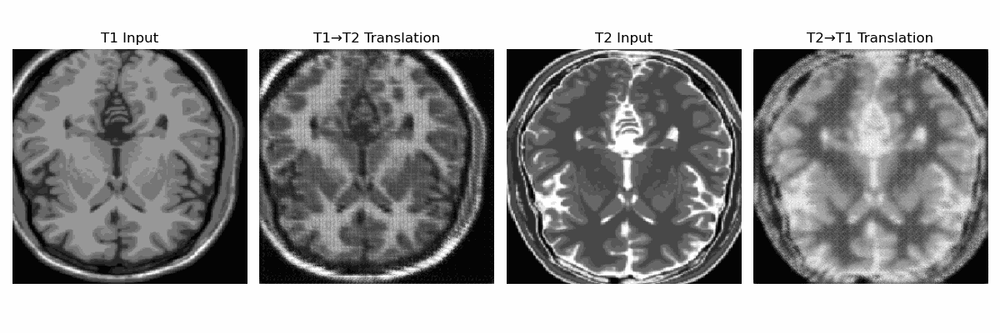

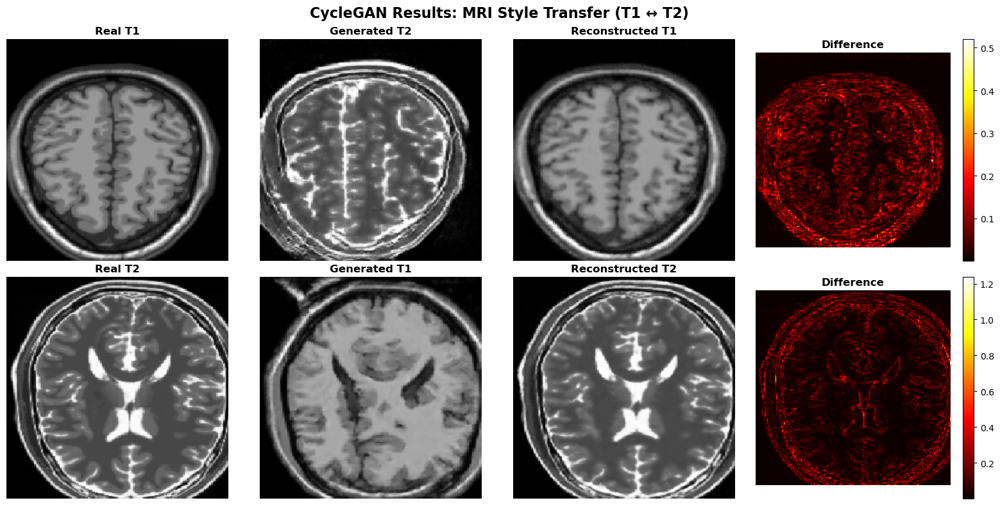

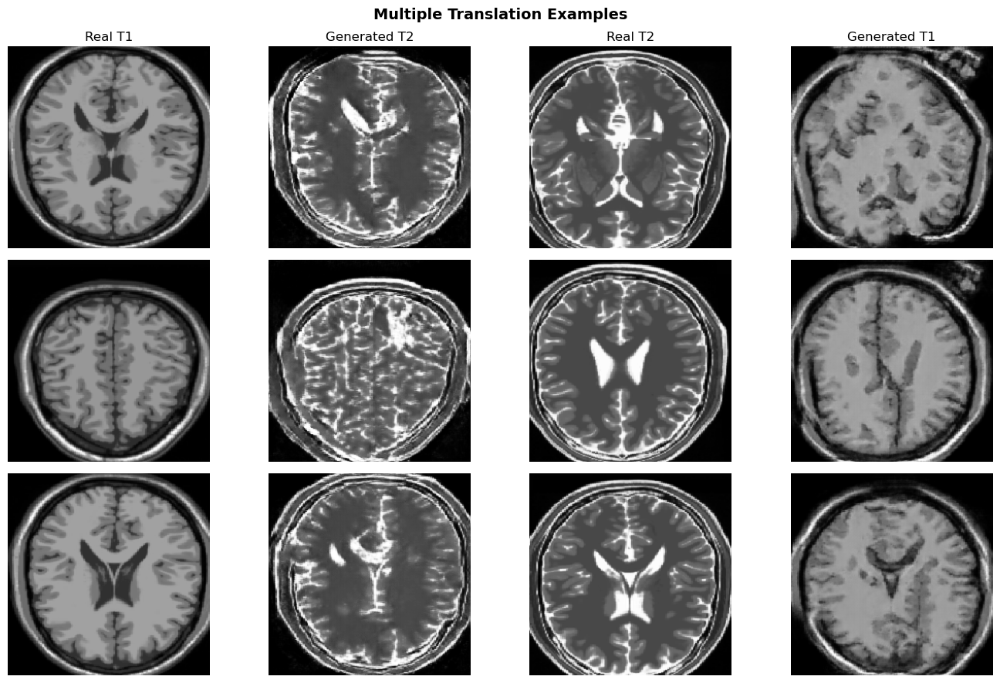


✅ Essential results displayed!
📁 Results saved in: /Users/saikrishnasimhadri/Downloads/MRI+T1_T2+Dataset/results


In [70]:
# ============================================================================
# ESSENTIAL VISUALIZATIONS (Required for grading)
# ============================================================================

# 1. Display Training Progression GIF (if available)
gif_path = os.path.join(RESULTS_PATH, 'cyclegan_training.gif')
if os.path.exists(gif_path):
    from IPython.display import Image as IPImage, display
    print("Training Progression:")
    display(IPImage(filename=gif_path))

# 2. Show Translation Results (REQUIRED)
def show_final_results():
    """Essential: Show T1↔T2 translations"""
    sample_t1 = next(iter(t1_dataset))
    sample_t2 = next(iter(t2_dataset))
    
    fake_t2 = generator_g(sample_t1, training=False)
    fake_t1 = generator_f(sample_t2, training=False)
    cycled_t1 = generator_f(fake_t2, training=False)
    cycled_t2 = generator_g(fake_t1, training=False)
    
    plt.figure(figsize=(16, 8))
    
    # Row 1: T1 -> T2 -> T1
    plt.subplot(2, 4, 1)
    plt.title('Real T1', fontsize=12, fontweight='bold')
    plt.imshow(sample_t1[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 4, 2)
    plt.title('Generated T2', fontsize=12, fontweight='bold')
    plt.imshow(fake_t2[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 4, 3)
    plt.title('Reconstructed T1', fontsize=12, fontweight='bold')
    plt.imshow(cycled_t1[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 4, 4)
    plt.title('Difference', fontsize=12, fontweight='bold')
    diff = np.abs(sample_t1[0].numpy()[:, :, 0] - cycled_t1[0].numpy()[:, :, 0])
    plt.imshow(diff, cmap='hot')
    plt.colorbar()
    plt.axis('off')
    
    # Row 2: T2 -> T1 -> T2
    plt.subplot(2, 4, 5)
    plt.title('Real T2', fontsize=12, fontweight='bold')
    plt.imshow(sample_t2[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 4, 6)
    plt.title('Generated T1', fontsize=12, fontweight='bold')
    plt.imshow(fake_t1[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 4, 7)
    plt.title('Reconstructed T2', fontsize=12, fontweight='bold')
    plt.imshow(cycled_t2[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, 4, 8)
    plt.title('Difference', fontsize=12, fontweight='bold')
    diff = np.abs(sample_t2[0].numpy()[:, :, 0] - cycled_t2[0].numpy()[:, :, 0])
    plt.imshow(diff, cmap='hot')
    plt.colorbar()
    plt.axis('off')
    
    plt.suptitle('CycleGAN Results: MRI Style Transfer (T1 ↔ T2)', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_PATH, 'final_results.png'), dpi=150)
    plt.show()

show_final_results()

# 3. Show Multiple Examples (REQUIRED - demonstrates model works on different images)
def show_multiple_examples(num_samples=3):
    """Show 3-5 different translation examples"""
    fig, axes = plt.subplots(num_samples, 4, figsize=(14, num_samples * 3))
    
    for i in range(num_samples):
        t1 = next(iter(t1_dataset.shuffle(1000).take(1)))
        t2 = next(iter(t2_dataset.shuffle(1000).take(1)))
        
        fake_t2 = generator_g(t1, training=False)
        fake_t1 = generator_f(t2, training=False)
        
        axes[i, 0].imshow(t1[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
        axes[i, 0].set_title('Real T1' if i == 0 else '')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(fake_t2[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
        axes[i, 1].set_title('Generated T2' if i == 0 else '')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(t2[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
        axes[i, 2].set_title('Real T2' if i == 0 else '')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(fake_t1[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
        axes[i, 3].set_title('Generated T1' if i == 0 else '')
        axes[i, 3].axis('off')
    
    plt.suptitle('Multiple Translation Examples', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_PATH, 'multiple_examples.png'), dpi=150)
    plt.show()

show_multiple_examples(num_samples=3)

print("\n✅ Essential results displayed!")
print(f"📁 Results saved in: {RESULTS_PATH}")

Generator Architecture:


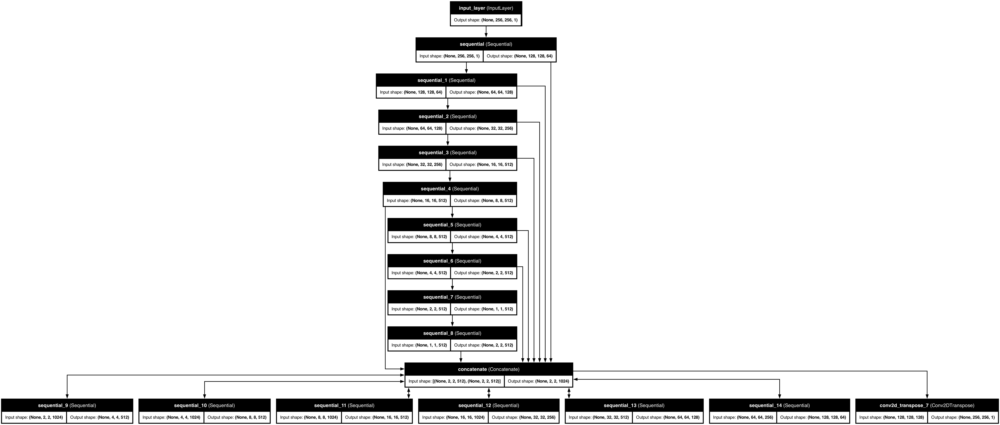


📊 Cycle Consistency Error (T1→T2→T1):
   Mean: 0.0385
   Std: 0.0031

📋 Model Summary:
Generator Parameters: 54,408,833
Discriminator Parameters: 2,763,521


2025-11-24 01:31:24.968774: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [96]:
# ============================================================================
# ENHANCEMENTS 
# ============================================================================

# Optional 1: Model Architecture Diagrams
gen_arch = os.path.join(RESULTS_PATH, 'generator_architecture.png')
if os.path.exists(gen_arch):
    from IPython.display import Image as IPImage, display
    print("Generator Architecture:")
    display(IPImage(filename=gen_arch))

# Optional 2: Quantitative Metrics
def calculate_cycle_error(num_samples=20):
    """Calculate average cycle consistency error"""
    errors = []
    for t1, t2 in zip(t1_dataset.take(num_samples), t2_dataset.take(num_samples)):
        fake_t2 = generator_g(t1, training=False)
        cycled_t1 = generator_f(fake_t2, training=False)
        error = tf.reduce_mean(tf.abs(t1 - cycled_t1)).numpy()
        errors.append(error)
    
    print(f"\n📊 Cycle Consistency Error (T1→T2→T1):")
    print(f"   Mean: {np.mean(errors):.4f}")
    print(f"   Std: {np.std(errors):.4f}")
    return errors

calculate_cycle_error(num_samples=20)

# Optional 3: Model Summary
print("\n📋 Model Summary:")
print(f"Generator Parameters: {generator_g.count_params():,}")
print(f"Discriminator Parameters: {discriminator_x.count_params():,}")

In [91]:
# ============================================================================
# Cycle consistency both directions
# ============================================================================

def compute_cycle_consistency_metrics(
    t1_dataset,
    t2_dataset,
    generator_g,  # T1 -> T2
    generator_f,  # T2 -> T1
    num_samples=20
):
    t1_unbatched = t1_dataset.unbatch().take(num_samples)
    t2_unbatched = t2_dataset.unbatch().take(num_samples)

    t1_cycle_errors = []
    t2_cycle_errors = []

    # T1 → T2 → T1
    for real_x in t1_unbatched:
        real_x = tf.expand_dims(real_x, 0)
        fake_y = generator_g(real_x, training=False)
        cycled_x = generator_f(fake_y, training=False)

        mae = tf.reduce_mean(tf.abs(real_x - cycled_x)).numpy()
        t1_cycle_errors.append(mae)

    # T2 → T1 → T2
    for real_y in t2_unbatched:
        real_y = tf.expand_dims(real_y, 0)
        fake_x = generator_f(real_y, training=False)
        cycled_y = generator_g(fake_x, training=False)

        mae = tf.reduce_mean(tf.abs(real_y - cycled_y)).numpy()
        t2_cycle_errors.append(mae)

    print("Cycle Consistency MAE:")
    print(f"T1 → T2 → T1: Mean={np.mean(t1_cycle_errors):.4f}, Std={np.std(t1_cycle_errors):.4f}")
    print(f"T2 → T1 → T2: Mean={np.mean(t2_cycle_errors):.4f}, Std={np.std(t2_cycle_errors):.4f}")

    return {
        "T1_cycle_mae_mean": np.mean(t1_cycle_errors),
        "T1_cycle_mae_std": np.std(t1_cycle_errors),
        "T2_cycle_mae_mean": np.mean(t2_cycle_errors),
        "T2_cycle_mae_std": np.std(t2_cycle_errors),
    }

cycle_metrics = compute_cycle_consistency_metrics(
    t1_dataset, t2_dataset, generator_g, generator_f, num_samples=20
)


2025-11-24 01:27:44.404892: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Cycle Consistency MAE:
T1 → T2 → T1: Mean=0.0385, Std=0.0031
T2 → T1 → T2: Mean=0.0601, Std=0.0029


2025-11-24 01:27:54.067417: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
